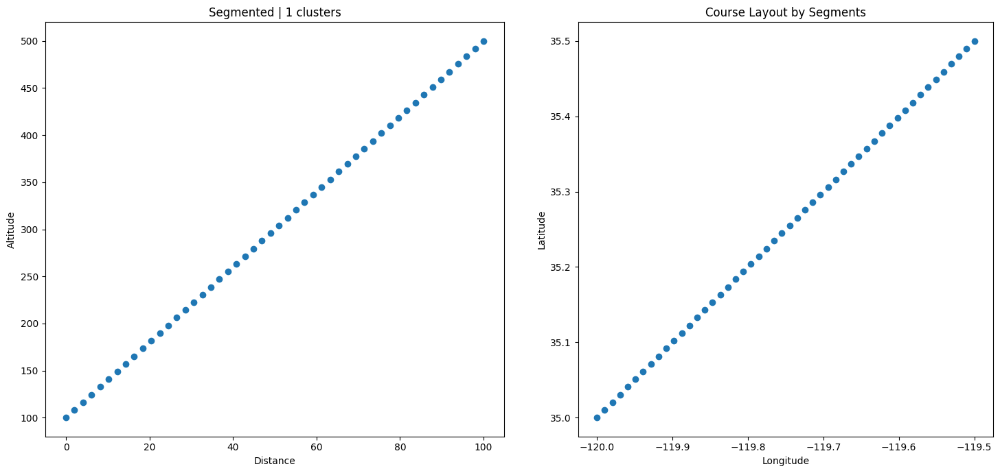

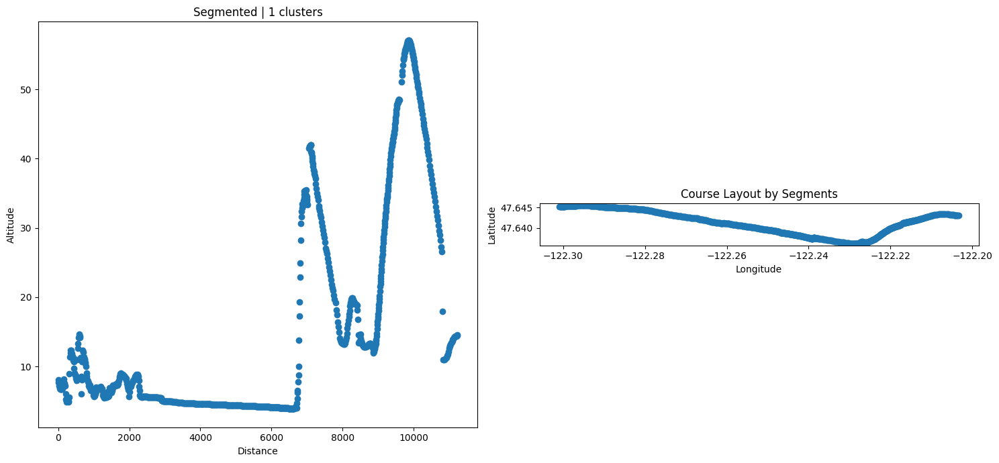

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.signal import savgol_filter
from scipy.spatial.distance import pdist, squareform
from sklearn.cluster import AgglomerativeClustering

# If you need any custom visualization tools from 'visualizations', you can import them here:
# from visualizations import *

class CourseSegmentation:
    def __init__(self, data, smoothing_window=11, poly_order=2, 
                 distance_threshold=5.0, linkage='complete'):
        """
        Initialize the class with course data and smoothing parameters.

        :param data: DataFrame with 'distance', 'gradient', 'heading', 'altitude', and optionally 'lat', 'lon'.
        :param smoothing_window: Window size for Savitzky-Golay filter.
        :param poly_order: Polynomial order for Savitzky-Golay filter.
        :param distance_threshold: Threshold for forming flat clusters in AgglomerativeClustering.
        :param linkage: Linkage criterion ('complete', 'average', 'single', etc.) for hierarchical clustering.
        """
        self.data = data.copy()
        self.smoothing_window = smoothing_window
        self.poly_order = poly_order
        
        # Hierarchical clustering parameters
        self.distance_threshold = distance_threshold
        self.linkage = linkage
        
        # Smooth the data
        self.smoothed_data = self.smooth_data()
        
        # Will hold clustering labels once computed
        self.labels = None

    def smooth_data(self):
        """
        Apply Savitzky-Golay filter to smooth noisy data.
        :return: Smoothed DataFrame.
        """
        smoothed = self.data.copy()
        # Apply smoothing to gradient, heading, altitude
        for col in ['gradient', 'heading', 'altitude']:
            if col in smoothed.columns:
                smoothed[col] = savgol_filter(smoothed[col], self.smoothing_window, self.poly_order)
        return smoothed

    @staticmethod
    def _compute_angular_distance(h1, h2):
        """
        Compute the minimal angular distance between two headings (in degrees).
        """
        diff = abs(h1 - h2) % 360
        return min(diff, 360 - diff)

    def _compute_custom_distance(self, point_a, point_b):
        """
        Custom distance between two points: (heading, gradient).
        
        Rules based on the (average) gradient:
          - If gradient > 0.02:     bias more towards gradient difference
          - If -0.2 <= gradient <= 0.2: heavily bias heading difference
          - If gradient < -0.2:     equal weighting of heading & gradient
        """
        heading_a, grad_a = point_a
        heading_b, grad_b = point_b

        # We'll use the average gradient of the two points to pick a weighting scheme
        avg_grad = (grad_a + grad_b) / 2.0

        # Choose weighting based on the average gradient
        if avg_grad > 0.02:
            # Heavily weight gradient
            w_heading = 0.1
            w_gradient = 0.9
        elif avg_grad < -0.02:
            # Equal weight
            w_heading = 0.5
            w_gradient = 0.5
        else:
            # Heavily weight heading
            w_heading = 0.9
            w_gradient = 0.1
            

        # Angular distance for heading
        heading_diff = self._compute_angular_distance(heading_a, heading_b)
        # Absolute difference for gradient
        grad_diff = abs(grad_a - grad_b)

        return w_heading * heading_diff + w_gradient * grad_diff

    def cluster_course_segments(self):
        """
        Clusters the course into segments based on heading & gradient similarity,
        using a custom distance function and hierarchical clustering.

        The results (cluster labels) are stored in self.labels
        and also in self.data['segment'] for plotting.
        """
        # Extract only the columns we need for the custom distance: heading & gradient
        # (If needed, you can incorporate altitude or others, but watch the weighting logic.)
        if not all(col in self.smoothed_data.columns for col in ['heading', 'gradient']):
            raise ValueError("Data must contain 'heading' and 'gradient' columns.")

        data_points = self.smoothed_data[['heading', 'gradient']].values

        # Build pairwise distance matrix using custom distance
        dist_matrix = squareform(
            pdist(data_points, metric=lambda u, v: self._compute_custom_distance(u, v))
        )

        # Perform hierarchical clustering with a distance threshold
        clusterer = AgglomerativeClustering(
            affinity='precomputed',
            linkage=self.linkage,
            distance_threshold=self.distance_threshold,
            n_clusters=None  # n_clusters=None => rely on distance_threshold to determine clusters
        )

        self.labels = clusterer.fit_predict(dist_matrix)
        # Store labels in the main DataFrame for convenience
        self.data['segment'] = self.labels

        return self.labels

    def plot_segments(self):
        """
        Plot the segmented course, coloring each segment.  
        Relies on self.data['segment'] (assigned in cluster_course_segments).
        
        Expects columns:
          - distance, altitude for the left plot
          - lat, lon for the right plot (if available)
        """
        if self.labels is None:
            print("No clusters found. Please run 'cluster_course_segments()' first.")
            return

        fig, axes = plt.subplots(1, 2, figsize=(15, 7))

        # Left subplot: Distance vs. Altitude
        if 'distance' in self.data.columns and 'altitude' in self.data.columns:
            for label in np.unique(self.labels):
                seg_data = self.data[self.data['segment'] == label]
                axes[0].scatter(seg_data['distance'], seg_data['altitude'], label=f"Seg {int(label)}")
            axes[0].set_xlabel("Distance")
            axes[0].set_ylabel("Altitude")
            axes[0].set_title(f"Segmented by Clustering | {len(np.unique(self.labels))} segments")
        else:
            axes[0].text(0.5, 0.5, 'Missing distance/altitude columns', ha='center', va='center')
        
        # Right subplot: lat vs. lon (if available)
        if all(col in self.data.columns for col in ['lat', 'lon']):
            for label in np.unique(self.labels):
                seg_data = self.data[self.data['segment'] == label]
                axes[1].scatter(seg_data['lon'], seg_data['lat'], label=f"Seg {int(label)}")
            axes[1].set_xlabel('Longitude')
            axes[1].set_ylabel('Latitude')
            axes[1].set_aspect('equal')
            axes[1].set_title("Course Layout by Segments")
        else:
            axes[1].text(0.5, 0.5, 'Missing lat/lon columns', ha='center', va='center')

        plt.tight_layout()
        plt.show()


class CourseSegmentation:
    def __init__(self, data, smoothing_window=11, poly_order=2, 
                 distance_threshold=5.0, linkage='complete',
                 gradient_min=-1.0, gradient_max=1.0):
        """
        :param data: DataFrame with columns at least ['lat', 'lon', 'distance', 'heading', 'gradient'].
        :param smoothing_window: Window size for Savitzky-Golay filter.
        :param poly_order: Polynomial order for Savitzky-Golay filter.
        :param distance_threshold: Threshold for forming flat clusters in AgglomerativeClustering.
        :param linkage: Linkage criterion ('complete', 'average', 'single', 'ward', etc.).
        :param gradient_min: Minimum possible gradient value (used for scaling).
        :param gradient_max: Maximum possible gradient value (used for scaling).
        """
        self.data = data.copy()
        self.smoothing_window = smoothing_window
        self.poly_order = poly_order
        
        # For hierarchical clustering
        self.distance_threshold = distance_threshold
        self.linkage = linkage
        
        # For gradient normalization
        self.gradient_min = gradient_min
        self.gradient_max = gradient_max
        
        self.smoothed_data = self.smooth_data()
        self.labels = None

    def smooth_data(self):
        """
        Apply Savitzky-Golay filter to smooth noisy data.
        """
        smoothed = self.data.copy()
        for col in ['gradient', 'heading', 'altitude']:
            if col in smoothed.columns:
                smoothed[col] = savgol_filter(smoothed[col], self.smoothing_window, self.poly_order)
        return smoothed

    @staticmethod
    def _compute_angular_distance(h1, h2):
        """
        Minimal angular distance between two headings (in degrees).
        """
        diff = abs(h1 - h2) % 360
        return min(diff, 360 - diff)

    def _normalize_heading_diff(self, h1, h2):
        """
        Return a normalizedheading difference in [0, 1].
        Maximum heading difference is 180° (the 'short way' around the circle).
        So dividing by 180 maps differences into [0, 1].
        """
        ang_dist = self._compute_angular_distance(h1, h2)
        return ang_dist / 180.0  # range [0..1]

    def _normalize_gradient(self, g):
        """
        Map gradient from [gradient_min, gradient_max] to [0, 1].
        If your gradient range is known and is [-1, 1], this can be:
          return (g + 1) / 2
        or for a generic [min, max]:
          return (g - min) / (max - min)
        """
        return (g - self.gradient_min) / (self.gradient_max - self.gradient_min)

    def _compute_custom_distance(self, point_a, point_b):
        """
        Custom distance between two points: (heading, gradient).
        
        Steps:
          1. Normalize heading difference into [0,1].
          2. Normalize each gradient into [0,1] and then compare them.
          3. Weight them based on avg gradient.

        Weight logic (unchanged):
          - If avg_grad > 0.02, weight gradient difference more  (0.3 heading, 0.7 grad)
          - If avg_grad < -0.2, weight them equally (0.5 each)
          - Else (-0.2 <= avg_grad <= 0.02), heavily weight heading (0.8 heading, 0.2 grad)
        """
        heading_a, grad_a = point_a
        heading_b, grad_b = point_b

        # 1) Compute normalized heading difference
        heading_diff_norm = self._normalize_heading_diff(heading_a, heading_b)

        # 2) Convert each gradient to [0,1], then get absolute difference in normalized space
        gA_norm = self._normalize_gradient(grad_a)
        gB_norm = self._normalize_gradient(grad_b)
        grad_diff_norm = abs(gA_norm - gB_norm)

        # 3) Determine weighting based on avg gradient (NOT normalized, but actual slope)
        avg_grad = (grad_a + grad_b) / 2.0
        if avg_grad > 0.02:
            w_heading, w_gradient = 0.3, 0.7
        elif avg_grad < -0.2:
            w_heading, w_gradient = 0.5, 0.5
        else:
            w_heading, w_gradient = 0.8, 0.2
            
        return w_heading * heading_diff_norm + w_gradient * grad_diff_norm

    def cluster_course_segments(self):
        """
        Use hierarchical clustering with a custom distance on (heading, gradient).
        """
        if not all(col in self.smoothed_data.columns for col in ['heading', 'gradient']):
            raise ValueError("Data must contain 'heading' and 'gradient' columns.")

        data_points = self.smoothed_data[['heading', 'gradient']].values
        
        # Build pairwise distance matrix using custom distance
        dist_matrix = squareform(
            pdist(data_points, metric=lambda u, v: self._compute_custom_distance(u, v))
        )

        clusterer = AgglomerativeClustering(
            affinity='precomputed',
            linkage=self.linkage,
            distance_threshold=self.distance_threshold,
            n_clusters=None
        )
        self.labels = clusterer.fit_predict(dist_matrix)
        self.data['segment'] = self.labels

        return self.labels

    def plot_segments(self):
        """
        Plots the resulting segmentation: 
        - Left subplot: distance vs altitude
        - Right subplot: lat vs lon (if present)
        """
        if self.labels is None:
            print("No clusters found. Please run 'cluster_course_segments()' first.")
            return

        fig, axes = plt.subplots(1, 2, figsize=(15, 7))
        
        # Left: distance vs altitude
        if 'distance' in self.data.columns and 'altitude' in self.data.columns:
            for label in np.unique(self.labels):
                seg_data = self.data[self.data['segment'] == label]
                axes[0].scatter(seg_data['distance'], seg_data['altitude'], label=f"Seg {int(label)}")
            axes[0].set_xlabel("Distance")
            axes[0].set_ylabel("Altitude")
            axes[0].set_title(f"Segmented | {len(np.unique(self.labels))} clusters")
        else:
            axes[0].text(0.5, 0.5, 'distance/altitude not found', ha='center', va='center')

        # Right: lat vs lon (if present)
        if all(col in self.data.columns for col in ['lat', 'lon']):
            for label in np.unique(self.labels):
                seg_data = self.data[self.data['segment'] == label]
                axes[1].scatter(seg_data['lon'], seg_data['lat'], label=f"Seg {int(label)}")
            axes[1].set_xlabel("Longitude")
            axes[1].set_ylabel("Latitude")
            axes[1].set_aspect('equal')
            axes[1].set_title("Course Layout by Segments")
        else:
            axes[1].text(0.5, 0.5, 'lat/lon not found', ha='center', va='center')

        plt.tight_layout()
        plt.show()

# -------------------------------
# Example usage (pseudo-code):
# -------------------------------
if __name__ == "__main__":
    # Suppose we have a DataFrame with these columns:
    #   distance, gradient, heading, altitude, lat, lon
    # Create or load your dataframe here. For example:
    df = pd.DataFrame({
        'distance': np.linspace(0, 100, 50),
        'gradient': np.random.uniform(-0.3, 0.3, 50),
        'heading': np.random.uniform(0, 360, 50),
        'altitude': np.linspace(100, 500, 50),
        'lat': np.linspace(35.0, 35.5, 50),
        'lon': np.linspace(-120.0, -119.5, 50)
    })
    
    # Instantiate the class
    segmenter = CourseSegmentation(
        data=df,
        smoothing_window=11,
        poly_order=2,
        distance_threshold=5.0,  # tweak as desired
        linkage='complete'       # you can also try 'single', 'average', etc.
    )
    
    # Run the custom clustering
    labels = segmenter.cluster_course_segments()
    
    # Plot the results
    segmenter.plot_segments()


data = pd.read_csv('520bridge.csv')
#calculate heading from the data based on lat and lon fields
heading = np.arctan2(np.diff(data['lat']), np.diff(data['lon'])) * 180 / np.pi
heading = np.append(heading, heading[-1])
data['gradient'] = data['gradient']/100
data['heading'] = heading
data['distance']=data['distance'].cumsum()


segmenter = CourseSegmentation(
    data=data,
    smoothing_window=5,
    poly_order=2,
    distance_threshold=2.0,  # tweak as desired
    linkage='complete',
    gradient_min=data['gradient'].min(),
    gradient_max=data['gradient'].max()
)
labels=segmenter.cluster_course_segments()

segmenter.plot_segments()

In [12]:
df=pd.read_csv('kona.csv')
df=compute_heading_from_latlon(df)
from test_cluster import *

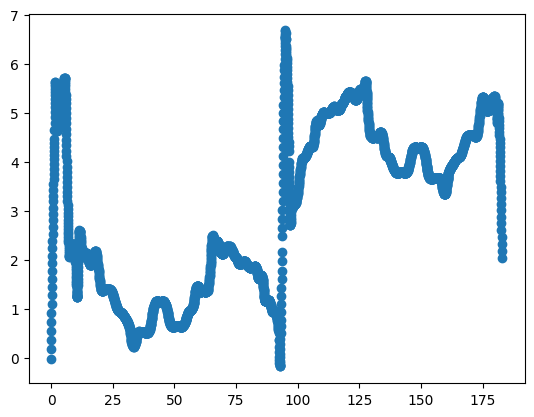

In [23]:
plt.scatter(segmenter.smoothed_data['cumulative_distance'], np.radians(segmenter.smoothed_data['heading']))

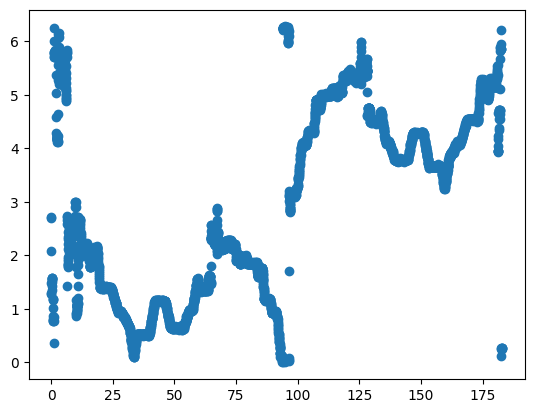

In [24]:
plt.scatter(df['cumulative_distance'], np.radians(df['heading']))

In [13]:

weight_dict = {
    'thresholds': [2, -2],
    #climbing weight, descending weight, flat weight
    'weights': [(0.1, 1.8), (0.5, 1), (1.8, 0.1)]
}
segmenter = CourseSegmentation(
    data=df,
    smoothing_window=68,    # smaller window for demonstration
    poly_order=2,
    distance_threshold=10.0, 
    linkage='complete',
    gradient_min=-0.3,     # match the extremes in this example
    gradient_max=0.35,
    weight_dict=weight_dict
)

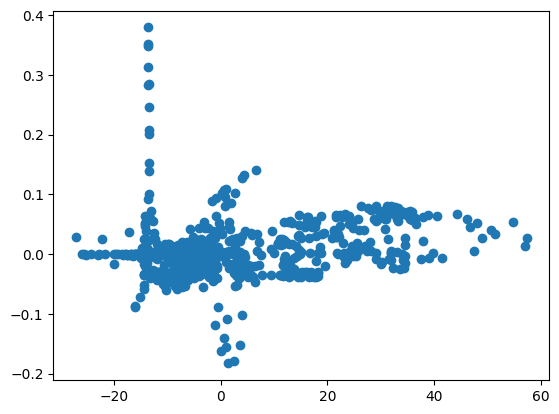

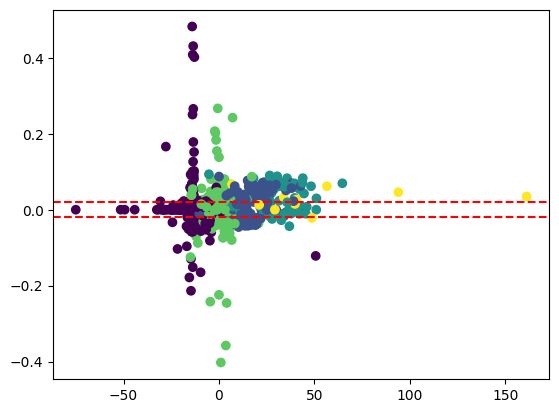

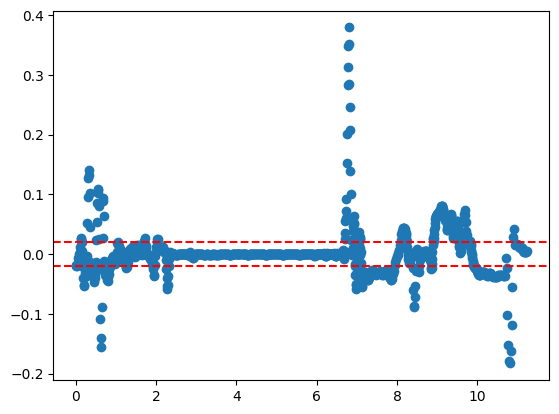

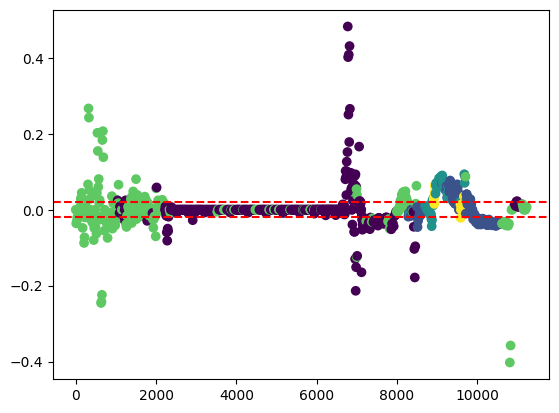

In [96]:

segmenter = CourseSegmentation(
    data=data,
    smoothing_window=10,
    poly_order=2,
    distance_threshold=10.0,  # tweak as desired
    linkage='complete'       # you can also try 'single', 'average', etc.
)
plt.scatter(segmenter.smoothed_data['heading'], segmenter.smoothed_data['gradient'])
plt.show()
plt.scatter(data.heading, data.gradient, c=labels)
#add horizontal dashed lines at 0.02 and -0.2
plt.axhline(y=0.02, color='r', linestyle='--')
plt.axhline(y=-0.020, color='r', linestyle='--')
plt.show()
plt.scatter(segmenter.smoothed_data['cumulative_distance'], segmenter.smoothed_data['gradient'])

plt.axhline(y=0.02, color='r', linestyle='--')
plt.axhline(y=-0.02, color='r', linestyle='--')
plt.show()
plt.show()
plt.scatter(data.distance, data.gradient, c=labels)
plt.axhline(y=0.02, color='r', linestyle='--')
plt.axhline(y=-0.02, color='r', linestyle='--')
plt.show()

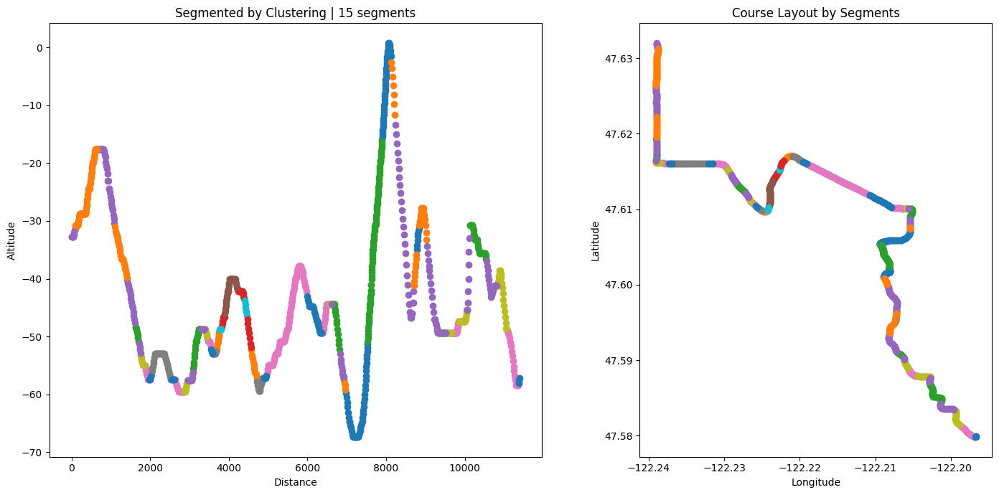

File: 520bridge.csv, SW: 51, PO: 2, DT: 5.0, LK: complete, Segments: 18


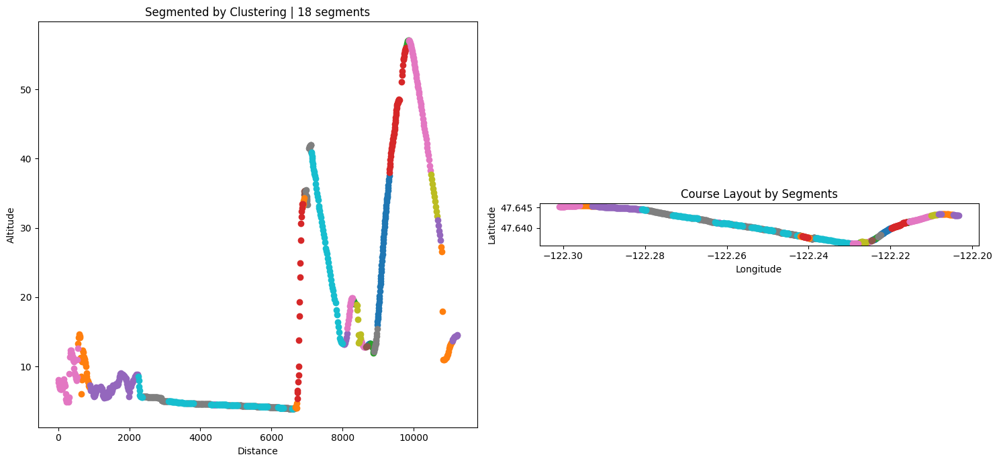

File: 520bridge.csv, SW: 51, PO: 2, DT: 10.0, LK: complete, Segments: 7


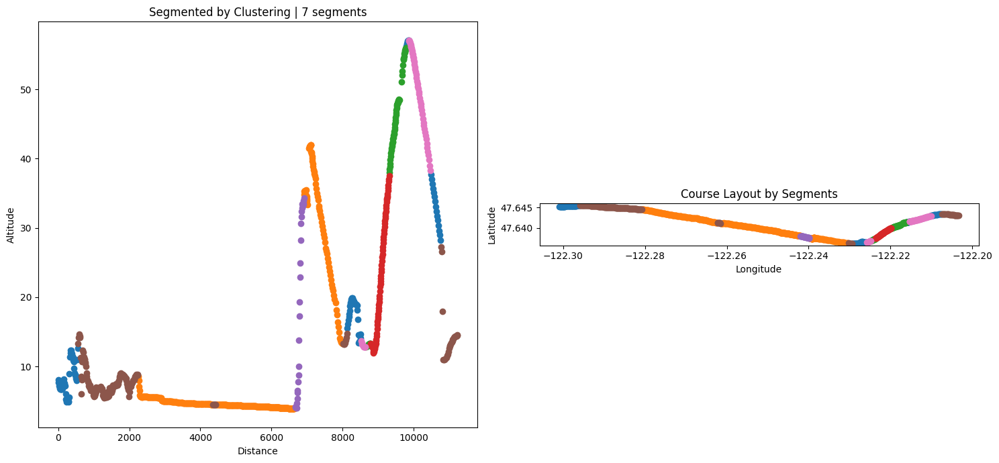

File: 520bridge.csv, SW: 51, PO: 2, DT: 15.0, LK: complete, Segments: 5


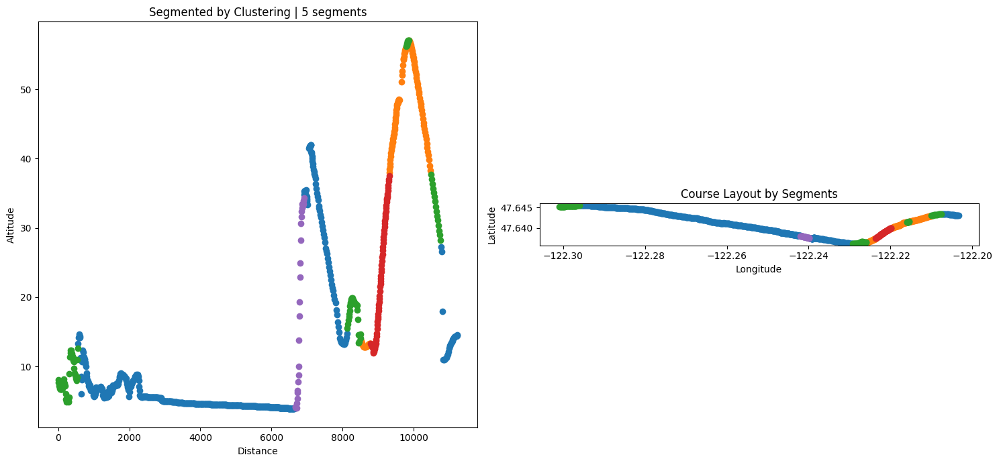

File: 520bridge.csv, SW: 51, PO: 2, DT: 20.0, LK: complete, Segments: 4


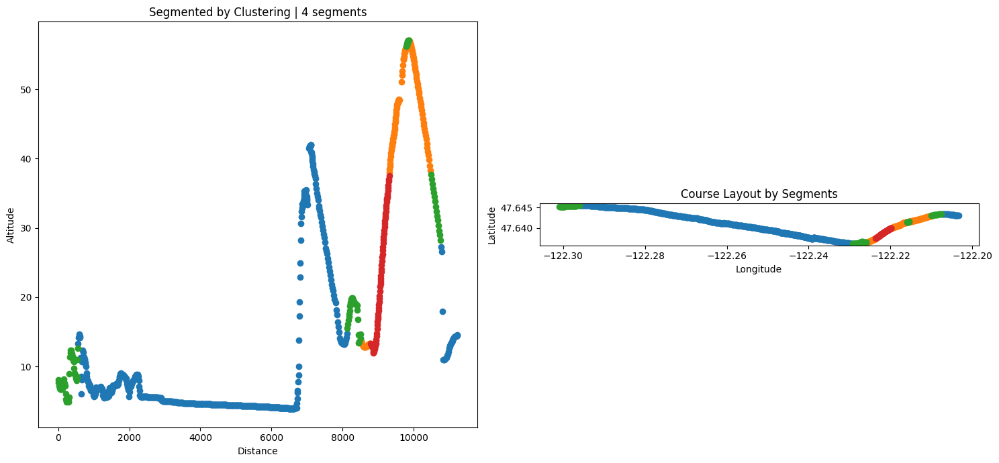

File: 520bridge.csv, SW: 51, PO: 3, DT: 5.0, LK: complete, Segments: 18


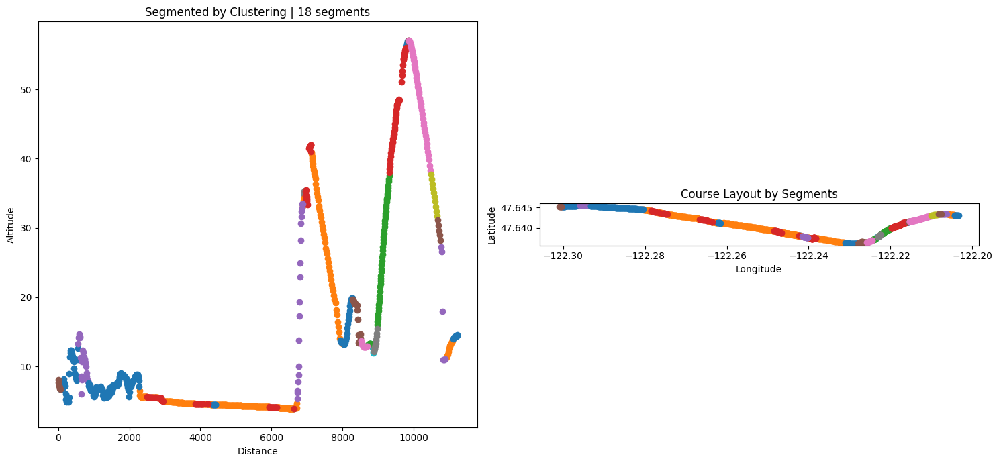

File: 520bridge.csv, SW: 51, PO: 3, DT: 10.0, LK: complete, Segments: 7


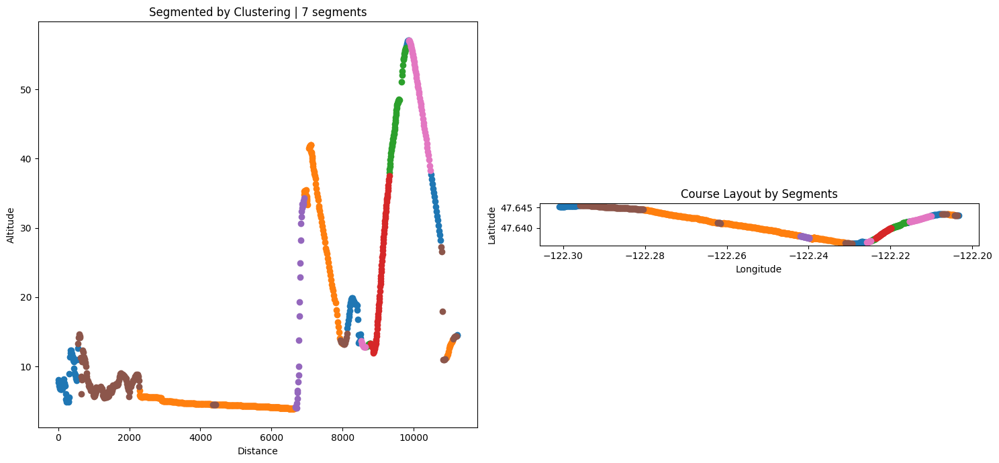

File: 520bridge.csv, SW: 51, PO: 3, DT: 15.0, LK: complete, Segments: 5


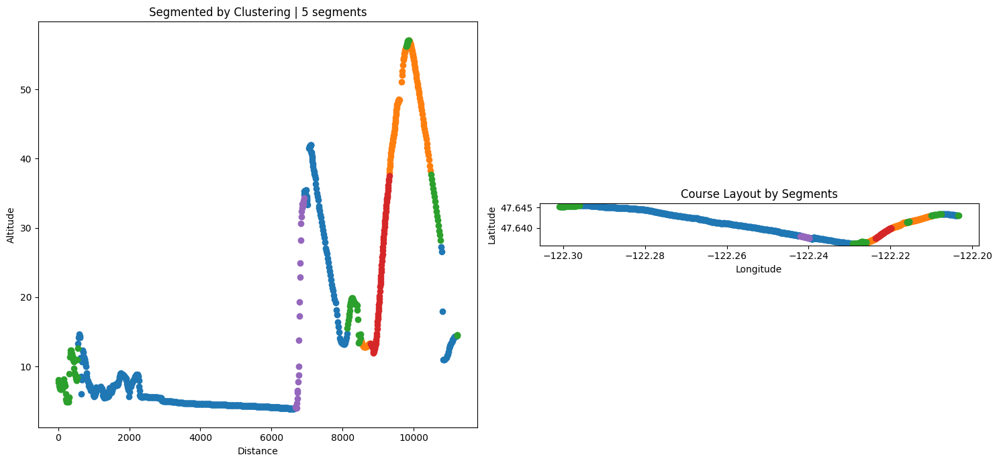

File: 520bridge.csv, SW: 51, PO: 3, DT: 20.0, LK: complete, Segments: 4


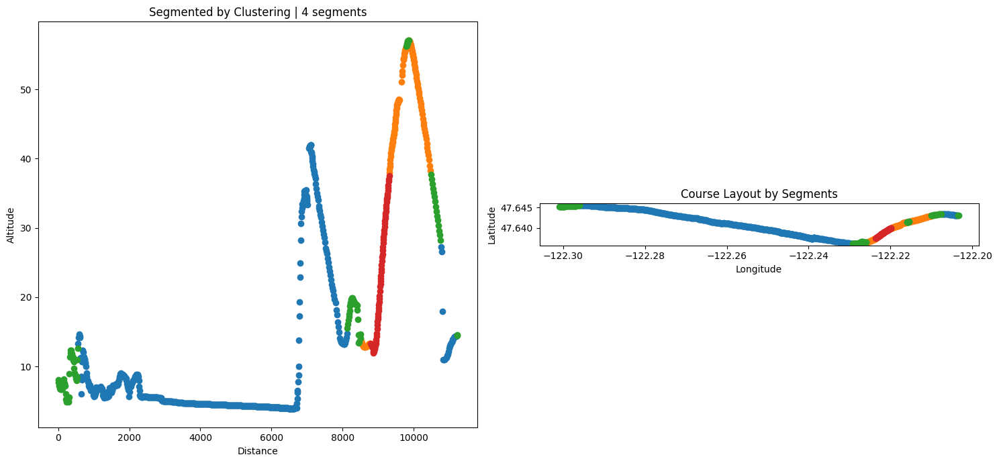

File: 520bridge.csv, SW: 51, PO: 4, DT: 5.0, LK: complete, Segments: 23


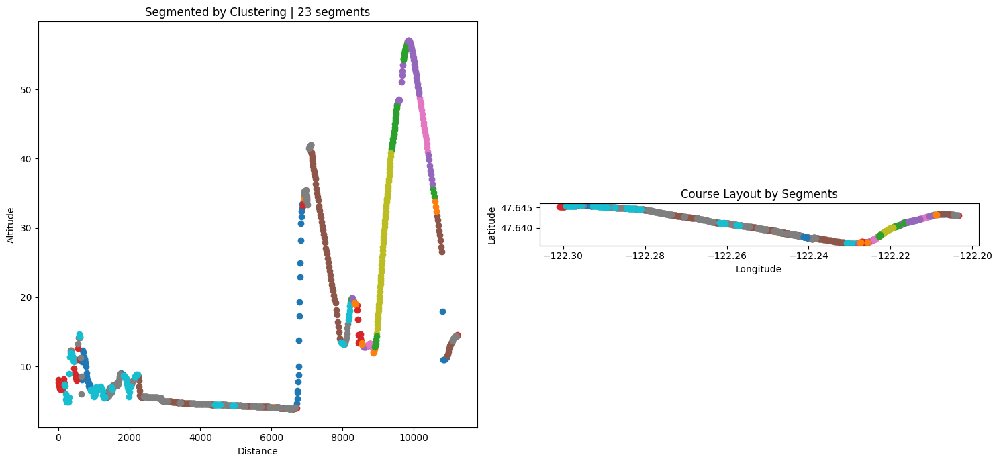

File: 520bridge.csv, SW: 51, PO: 4, DT: 10.0, LK: complete, Segments: 10


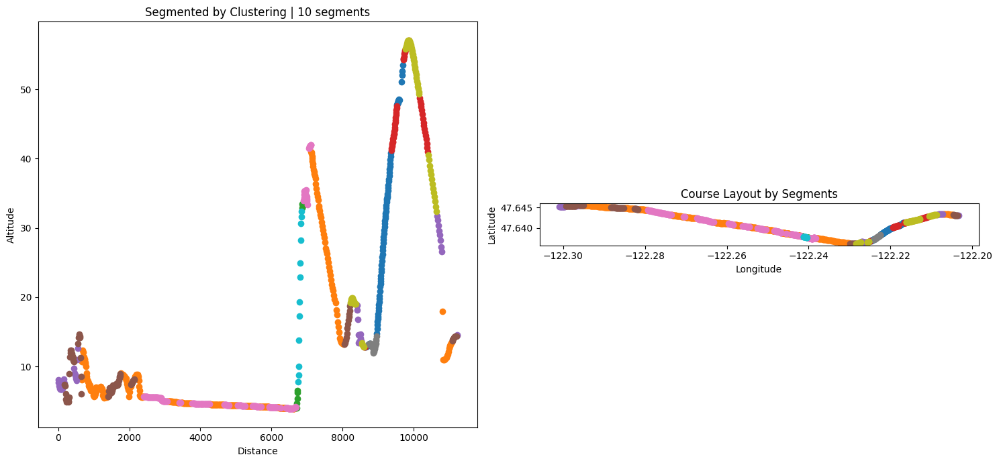

File: 520bridge.csv, SW: 51, PO: 4, DT: 15.0, LK: complete, Segments: 5


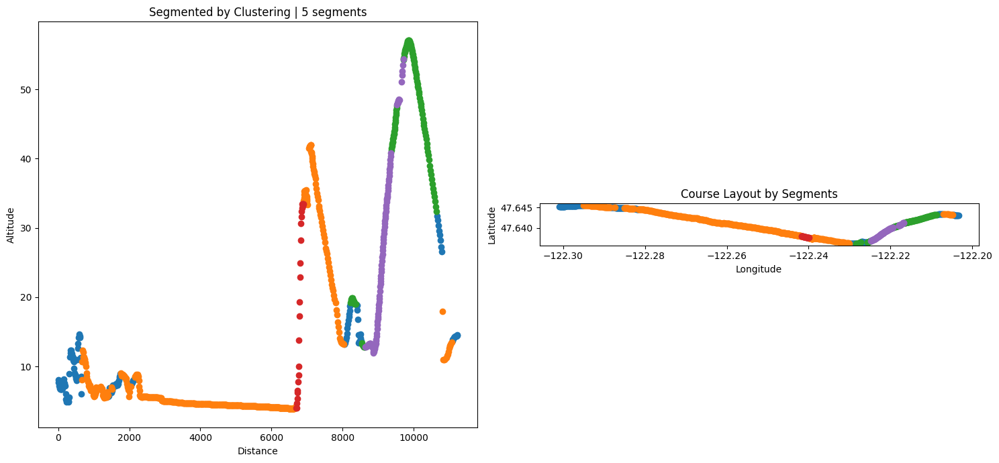

File: 520bridge.csv, SW: 51, PO: 4, DT: 20.0, LK: complete, Segments: 5


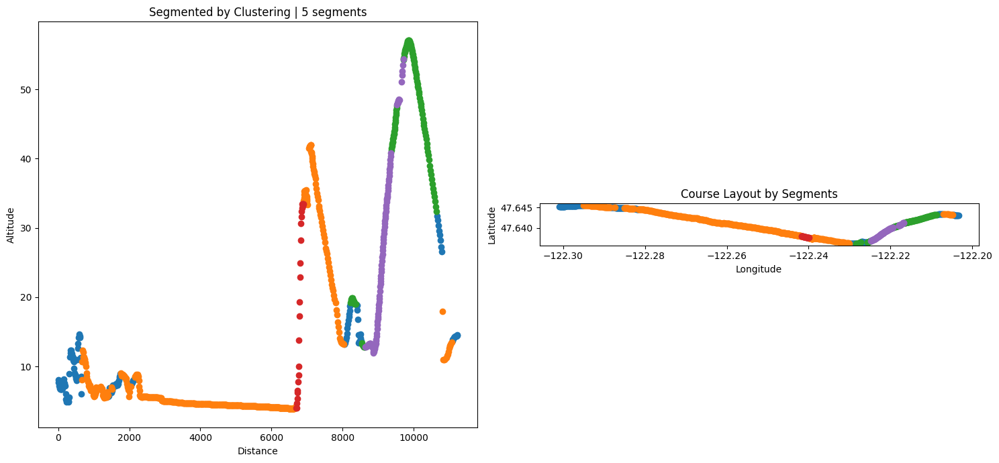

File: 520bridge.csv, SW: 101, PO: 2, DT: 5.0, LK: complete, Segments: 14


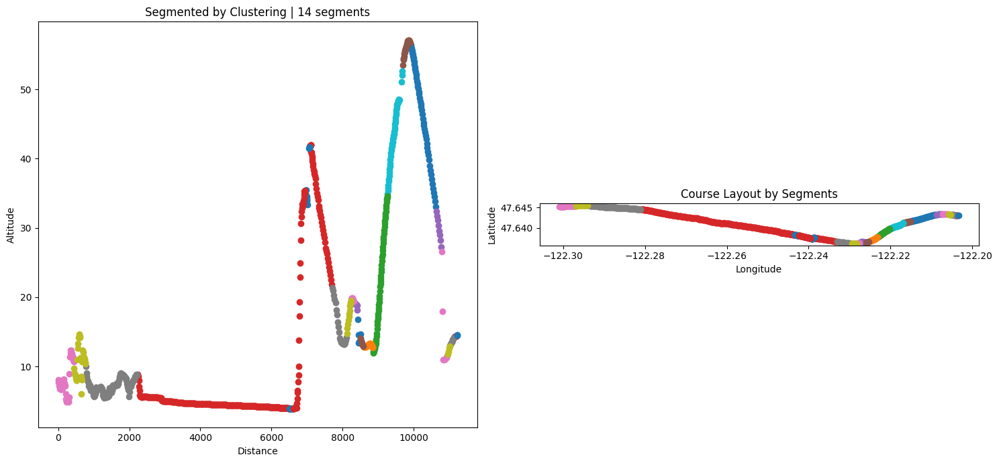

File: 520bridge.csv, SW: 101, PO: 2, DT: 10.0, LK: complete, Segments: 7


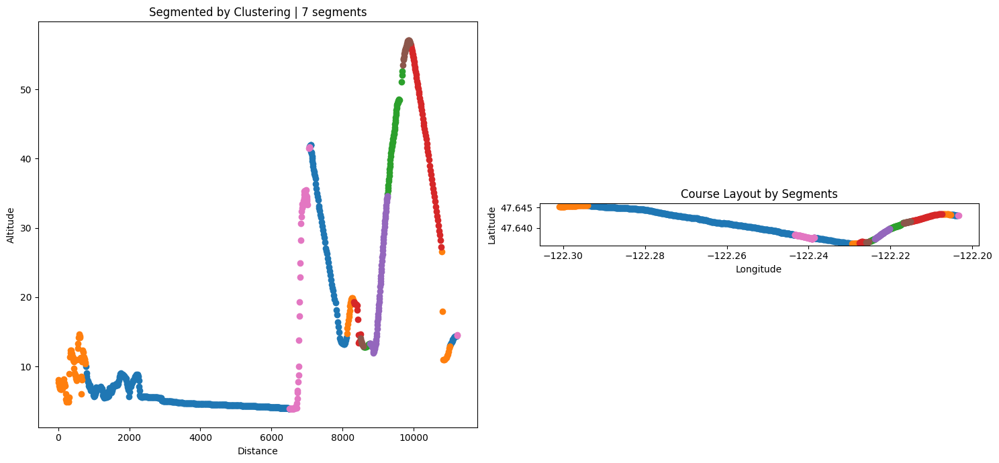

File: 520bridge.csv, SW: 101, PO: 2, DT: 15.0, LK: complete, Segments: 4


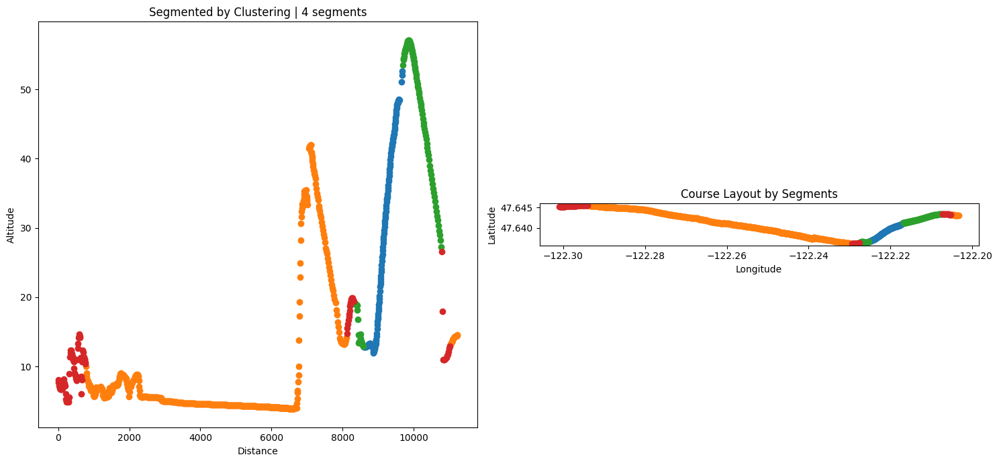

File: 520bridge.csv, SW: 101, PO: 2, DT: 20.0, LK: complete, Segments: 3


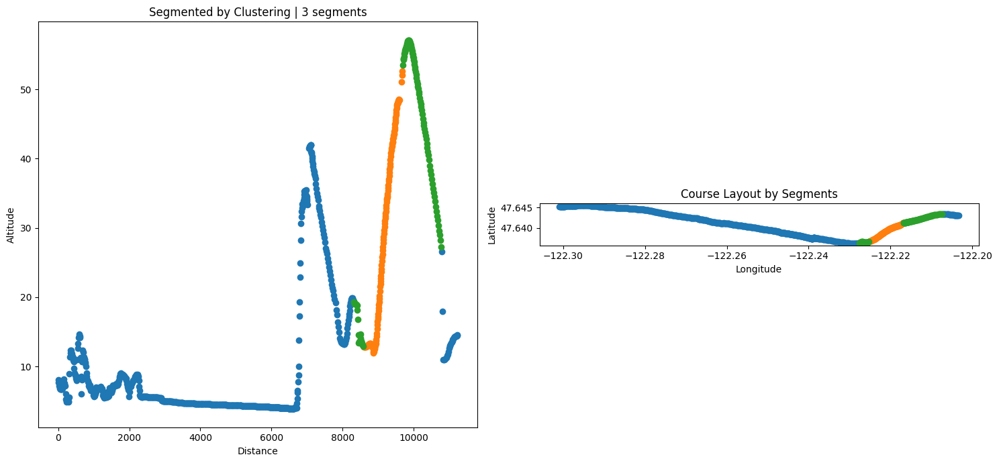

File: 520bridge.csv, SW: 101, PO: 3, DT: 5.0, LK: complete, Segments: 17


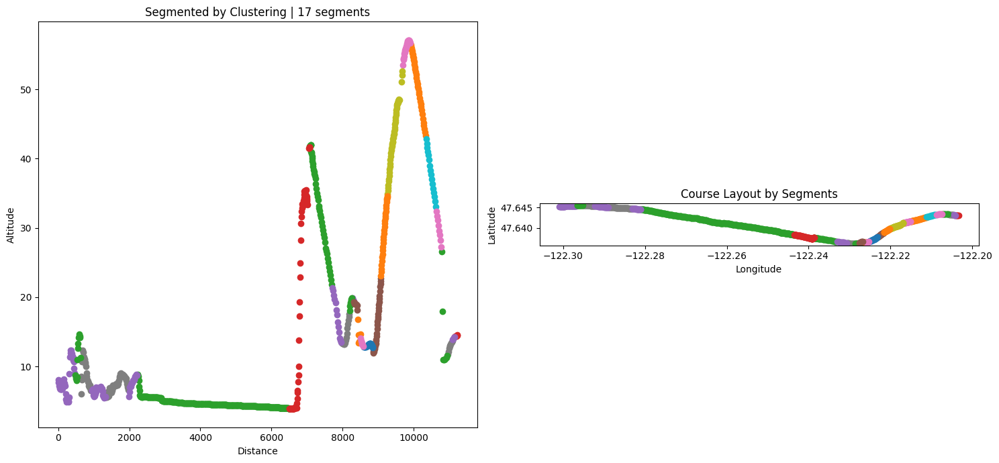

File: 520bridge.csv, SW: 101, PO: 3, DT: 10.0, LK: complete, Segments: 6


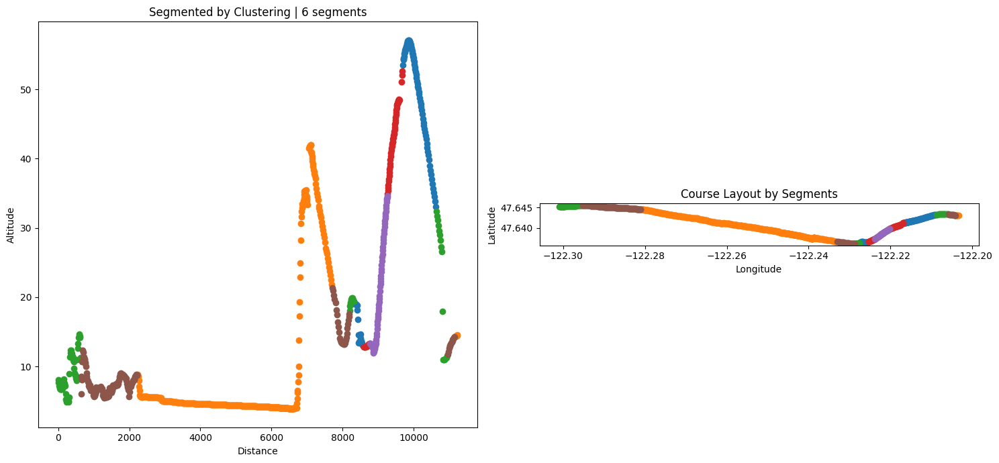

File: 520bridge.csv, SW: 101, PO: 3, DT: 15.0, LK: complete, Segments: 4


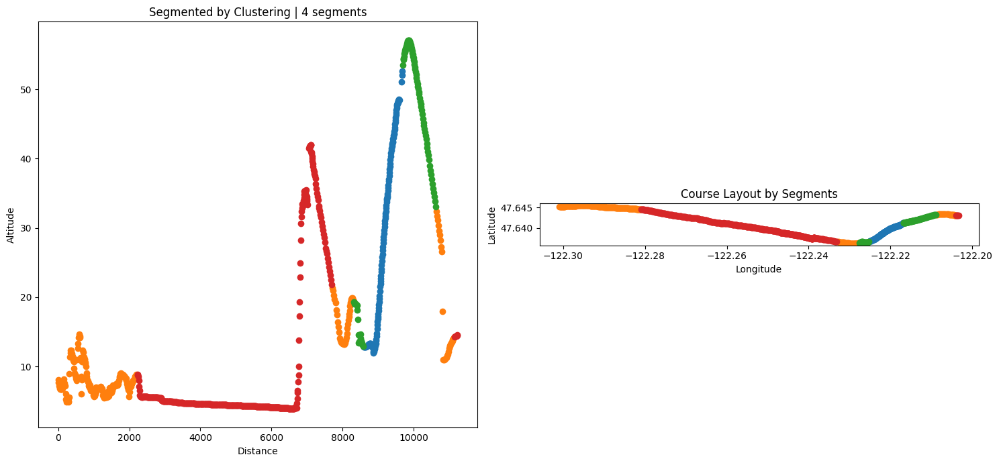

File: 520bridge.csv, SW: 101, PO: 3, DT: 20.0, LK: complete, Segments: 3


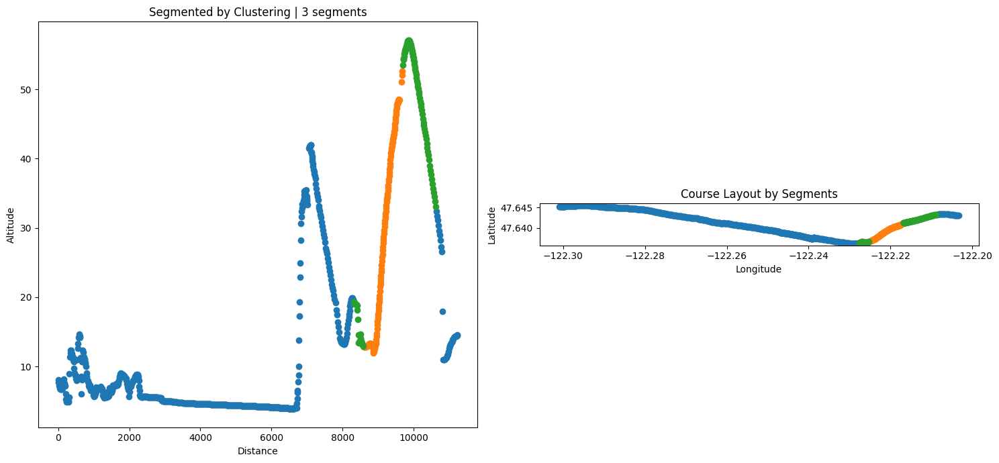

File: 520bridge.csv, SW: 101, PO: 4, DT: 5.0, LK: complete, Segments: 17


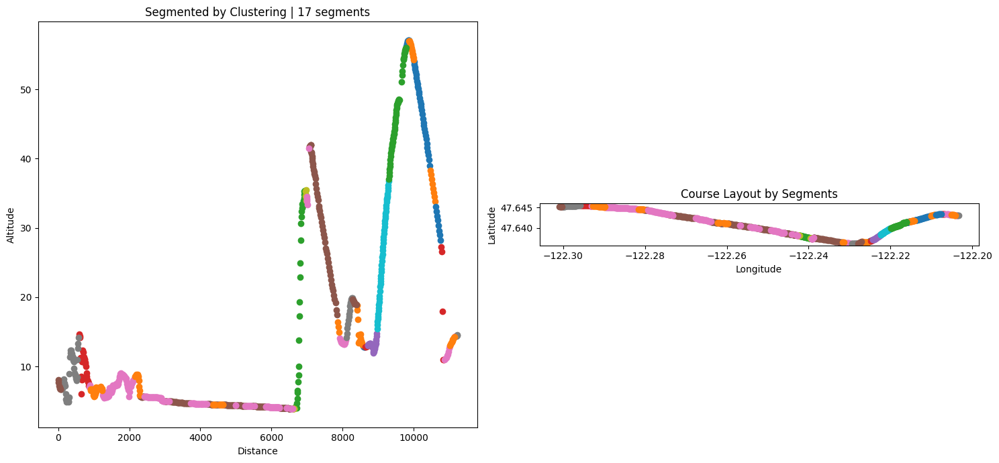

File: 520bridge.csv, SW: 101, PO: 4, DT: 10.0, LK: complete, Segments: 7


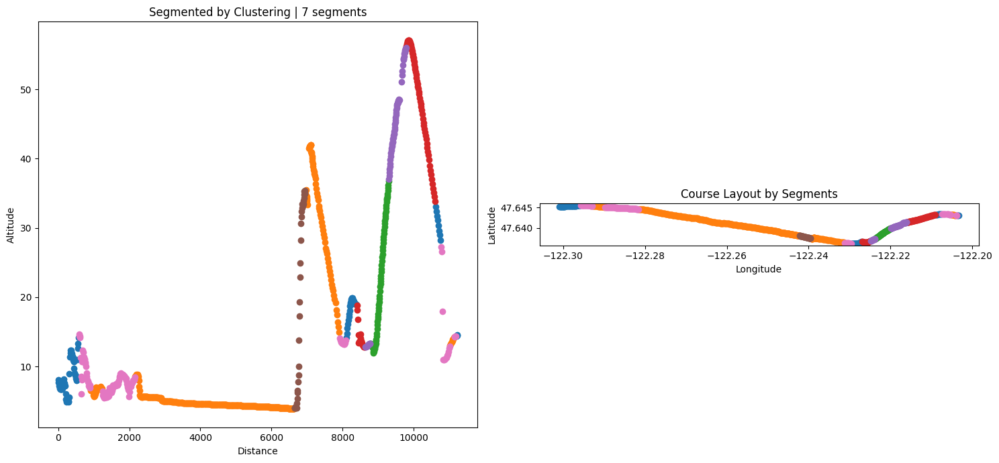

File: 520bridge.csv, SW: 101, PO: 4, DT: 15.0, LK: complete, Segments: 5


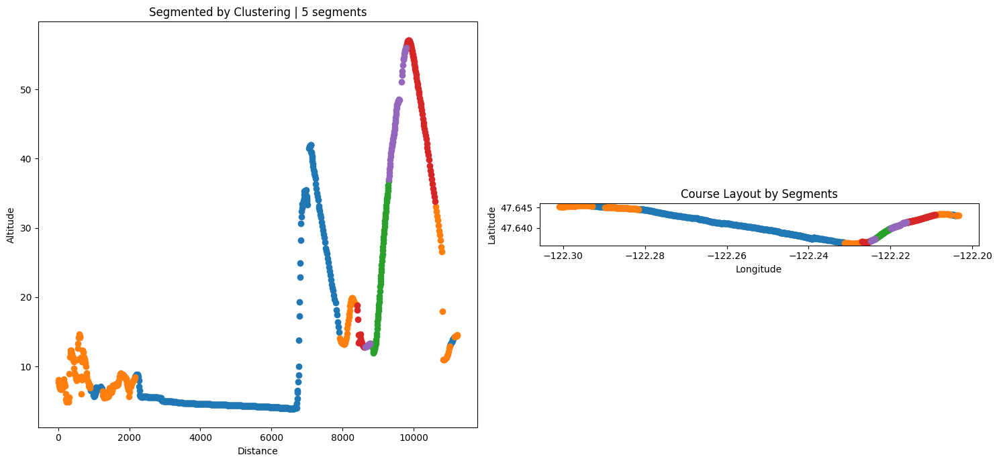

File: 520bridge.csv, SW: 101, PO: 4, DT: 20.0, LK: complete, Segments: 3


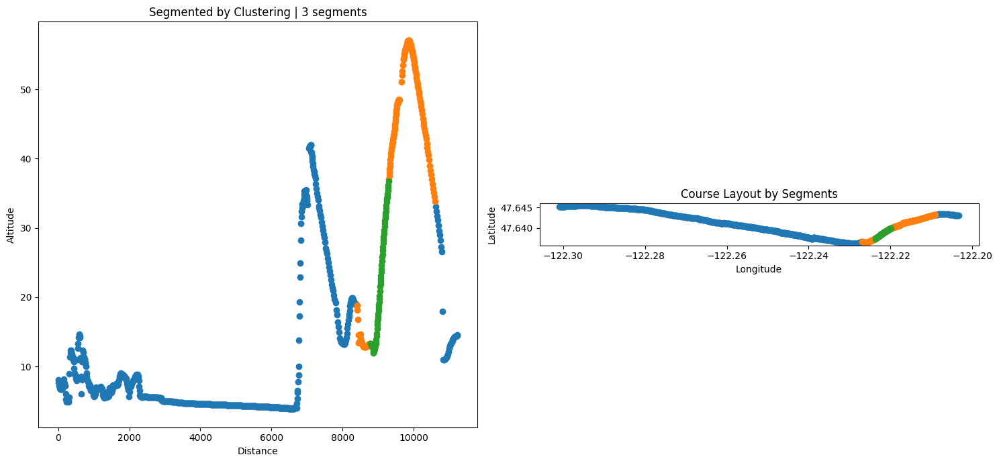

File: 520bridge.csv, SW: 301, PO: 2, DT: 5.0, LK: complete, Segments: 10


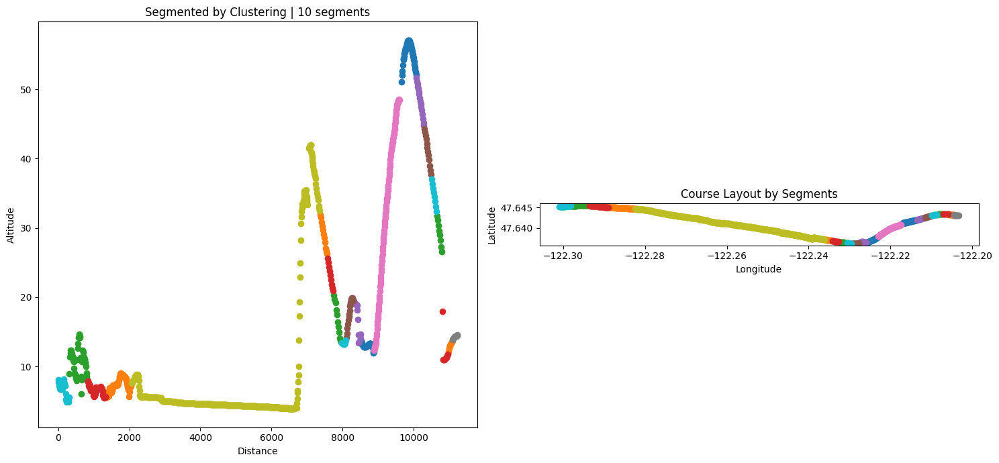

File: 520bridge.csv, SW: 301, PO: 2, DT: 10.0, LK: complete, Segments: 4


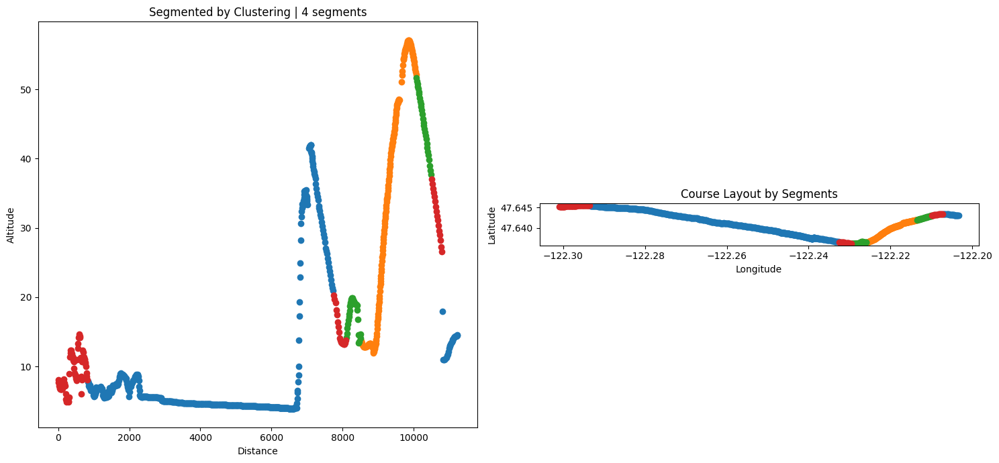

File: 520bridge.csv, SW: 301, PO: 2, DT: 15.0, LK: complete, Segments: 3


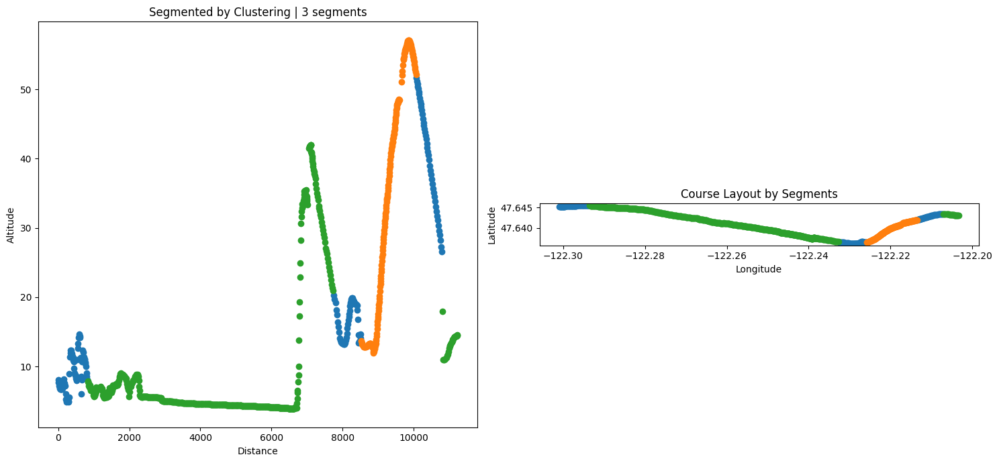

File: 520bridge.csv, SW: 301, PO: 2, DT: 20.0, LK: complete, Segments: 3


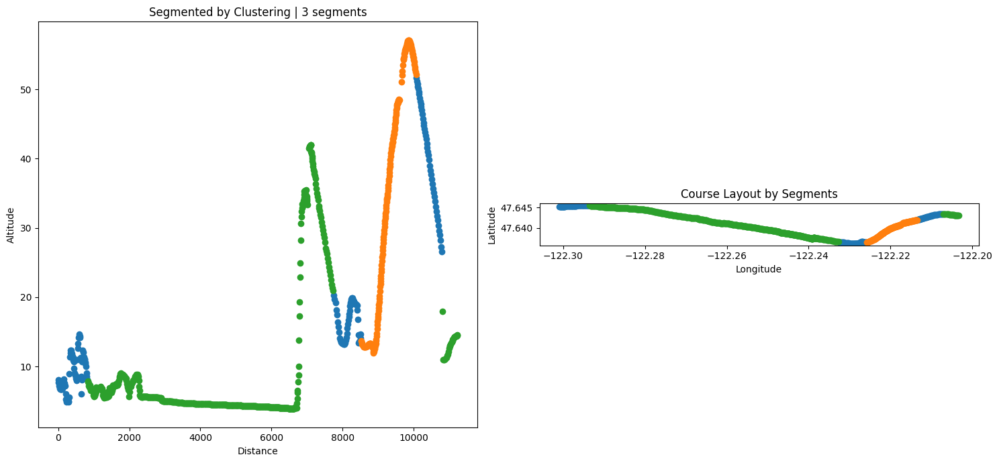

File: 520bridge.csv, SW: 301, PO: 3, DT: 5.0, LK: complete, Segments: 8


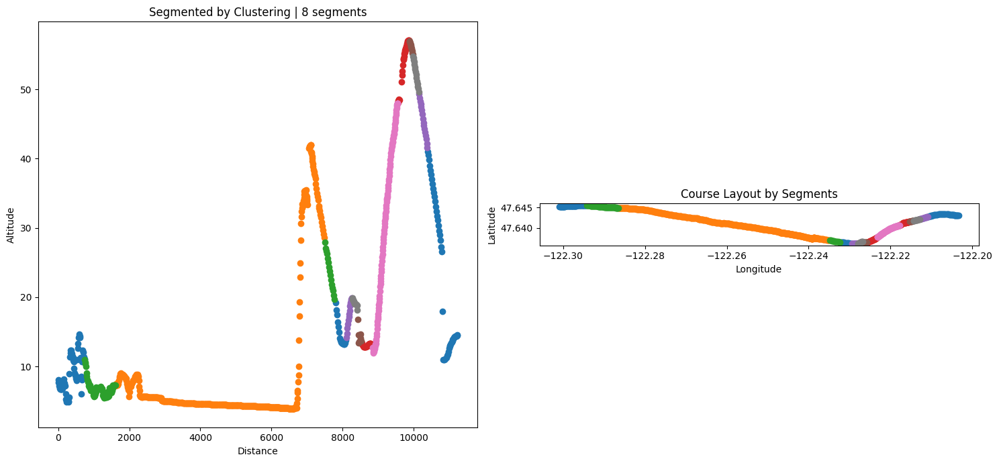

File: 520bridge.csv, SW: 301, PO: 3, DT: 10.0, LK: complete, Segments: 4


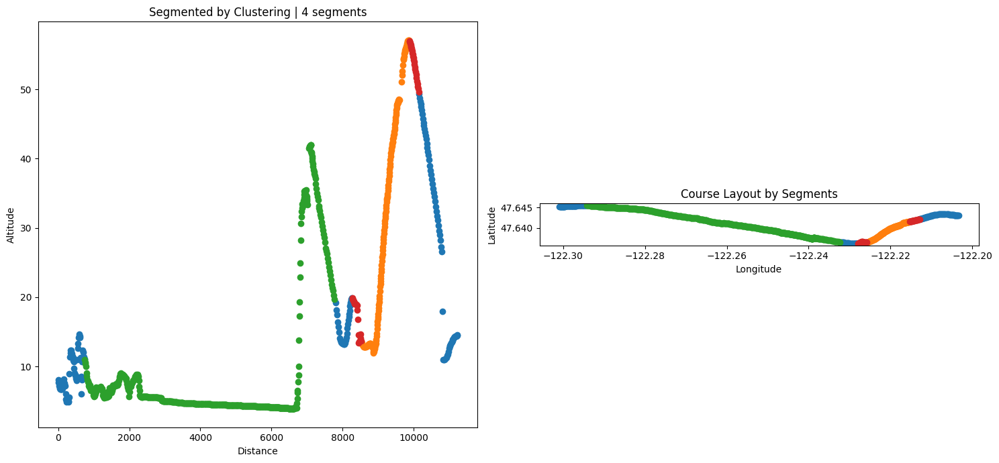

File: 520bridge.csv, SW: 301, PO: 3, DT: 15.0, LK: complete, Segments: 3


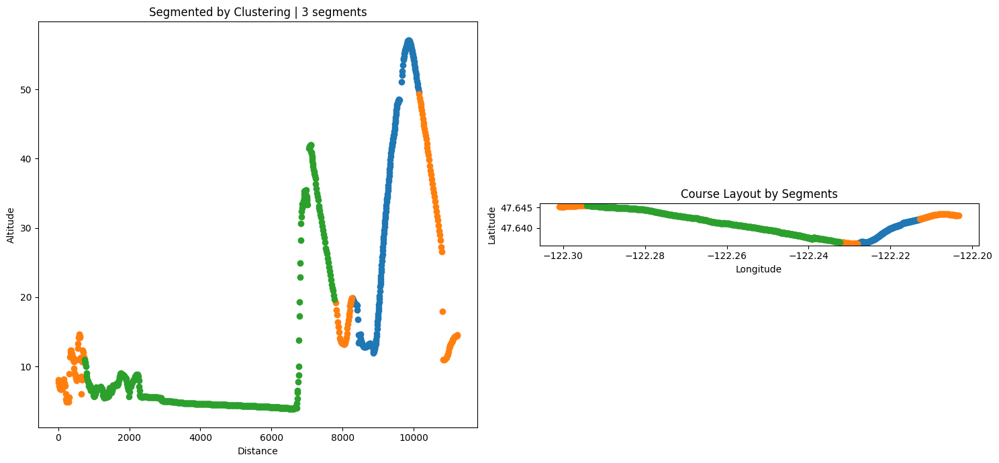

File: 520bridge.csv, SW: 301, PO: 3, DT: 20.0, LK: complete, Segments: 3


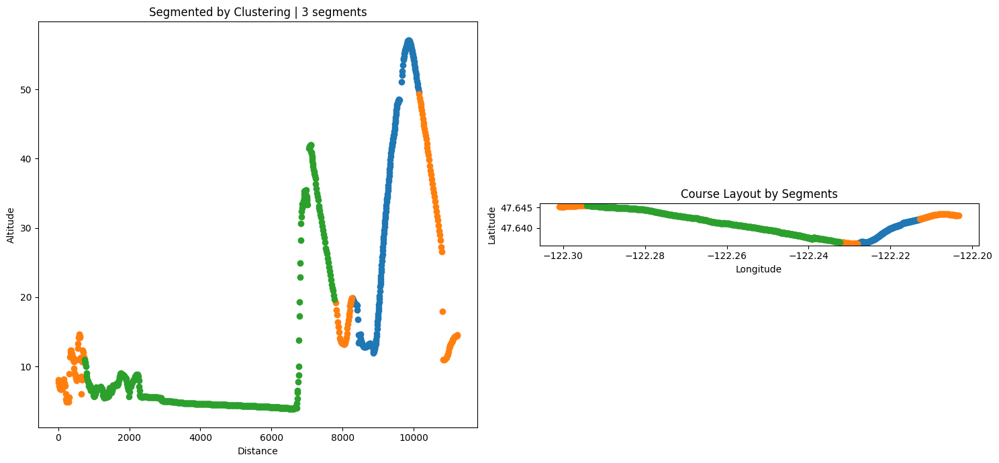

File: 520bridge.csv, SW: 301, PO: 4, DT: 5.0, LK: complete, Segments: 10


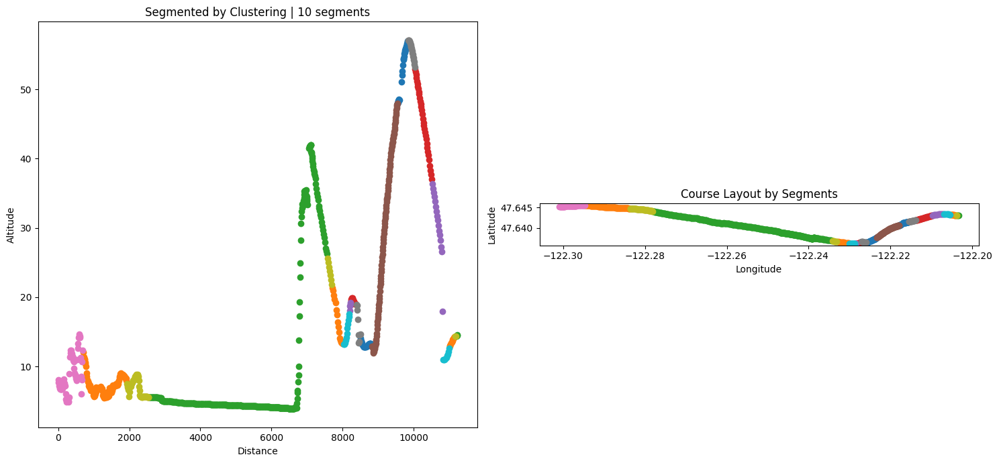

File: 520bridge.csv, SW: 301, PO: 4, DT: 10.0, LK: complete, Segments: 5


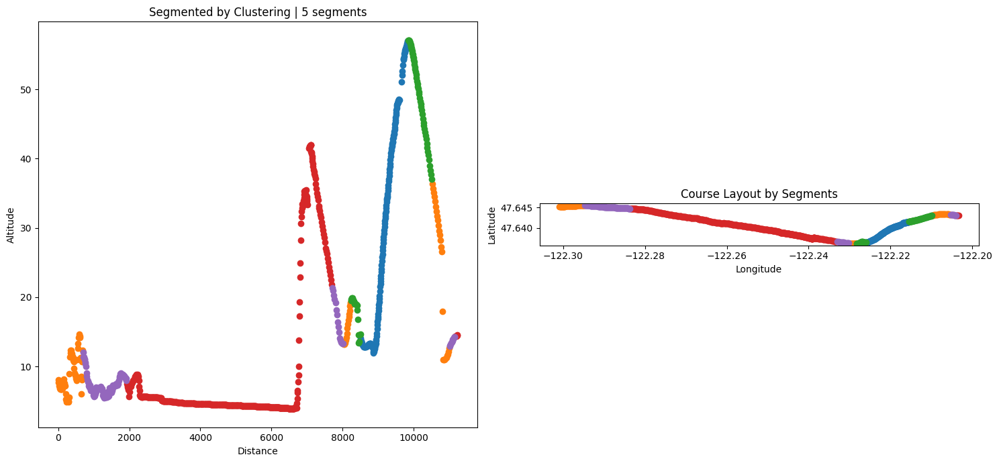

File: 520bridge.csv, SW: 301, PO: 4, DT: 15.0, LK: complete, Segments: 4


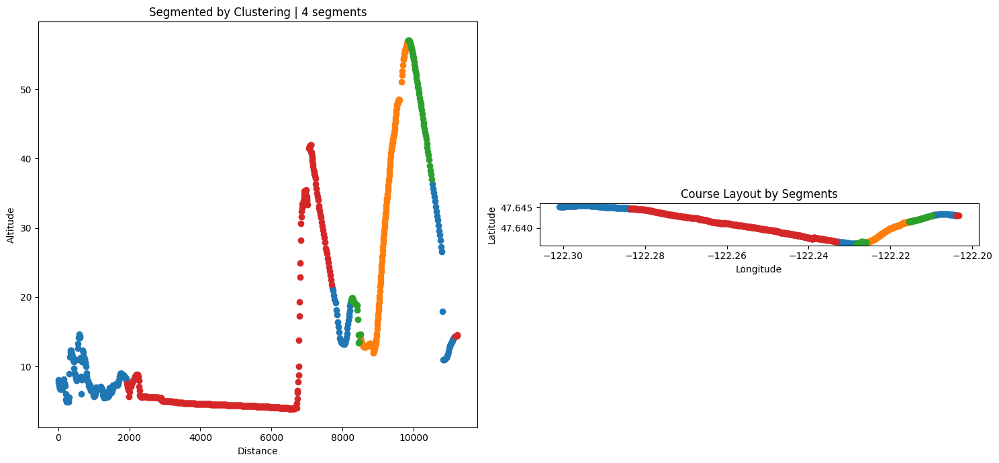

File: 520bridge.csv, SW: 301, PO: 4, DT: 20.0, LK: complete, Segments: 3


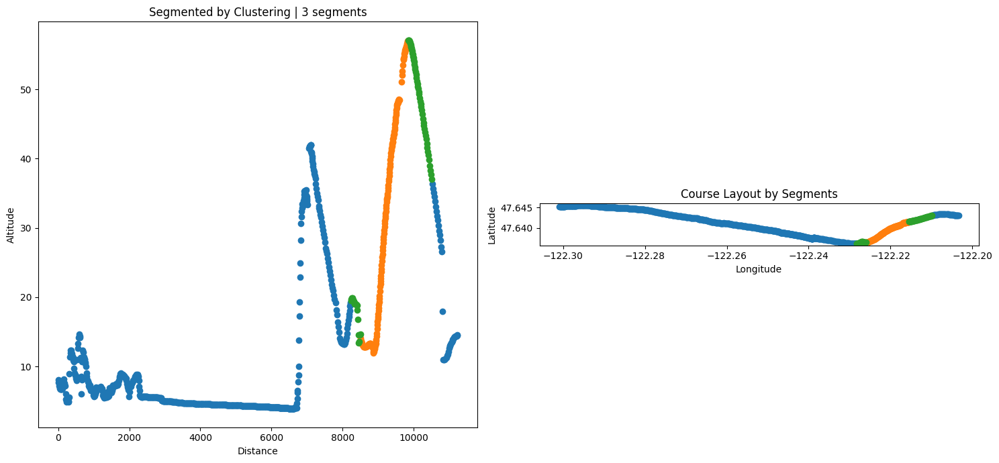

File: bellvue_blaseter.csv, SW: 51, PO: 2, DT: 5.0, LK: complete, Segments: 75


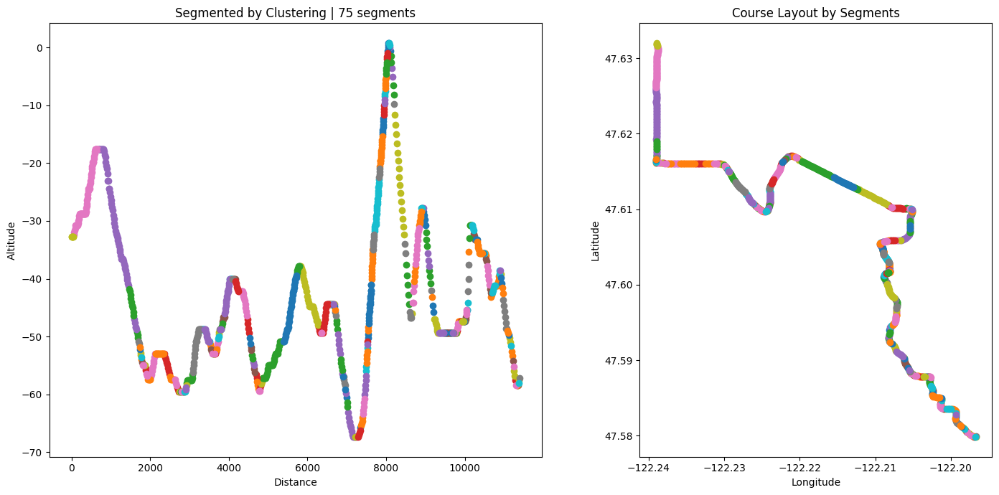

File: bellvue_blaseter.csv, SW: 51, PO: 2, DT: 10.0, LK: complete, Segments: 31


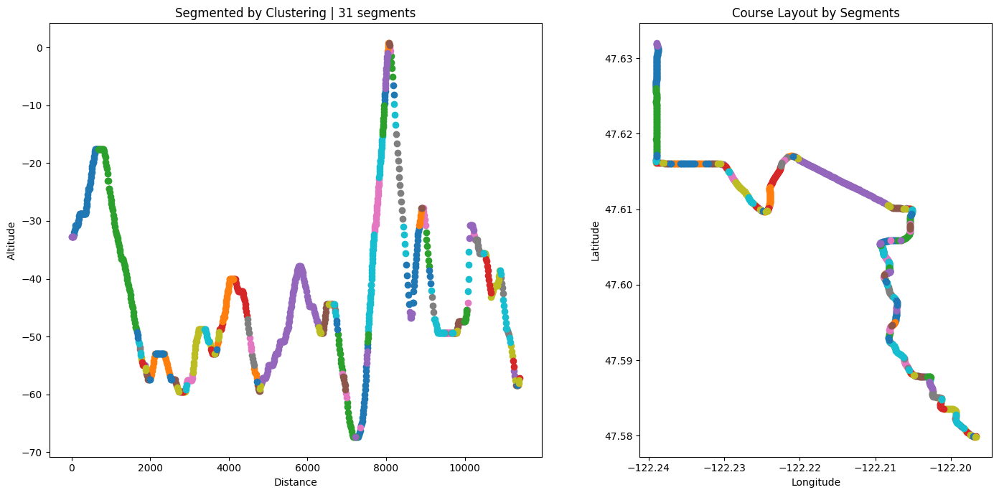

File: bellvue_blaseter.csv, SW: 51, PO: 2, DT: 15.0, LK: complete, Segments: 17


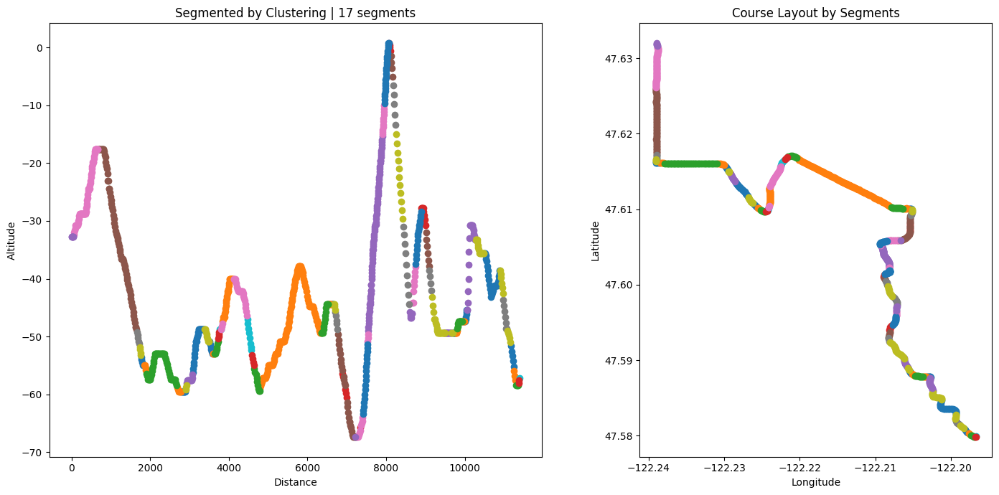

File: bellvue_blaseter.csv, SW: 51, PO: 2, DT: 20.0, LK: complete, Segments: 14


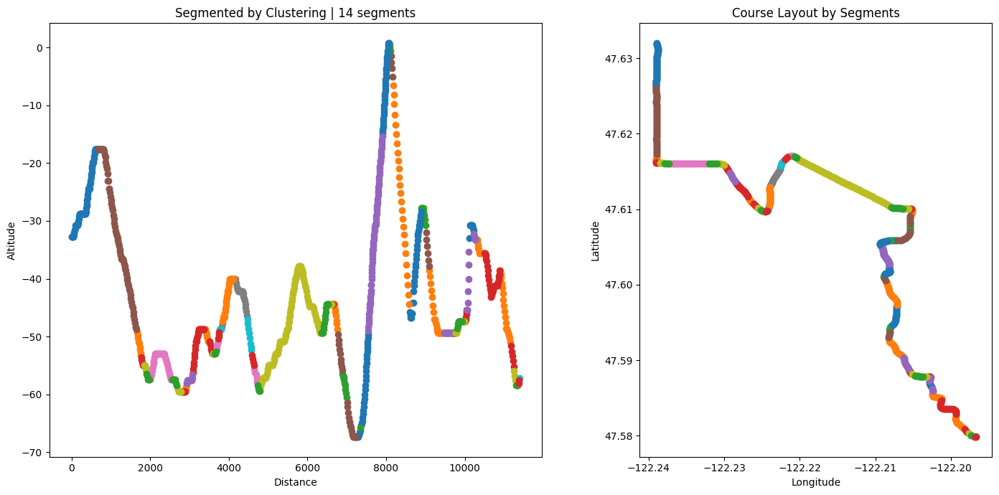

File: bellvue_blaseter.csv, SW: 51, PO: 3, DT: 5.0, LK: complete, Segments: 77


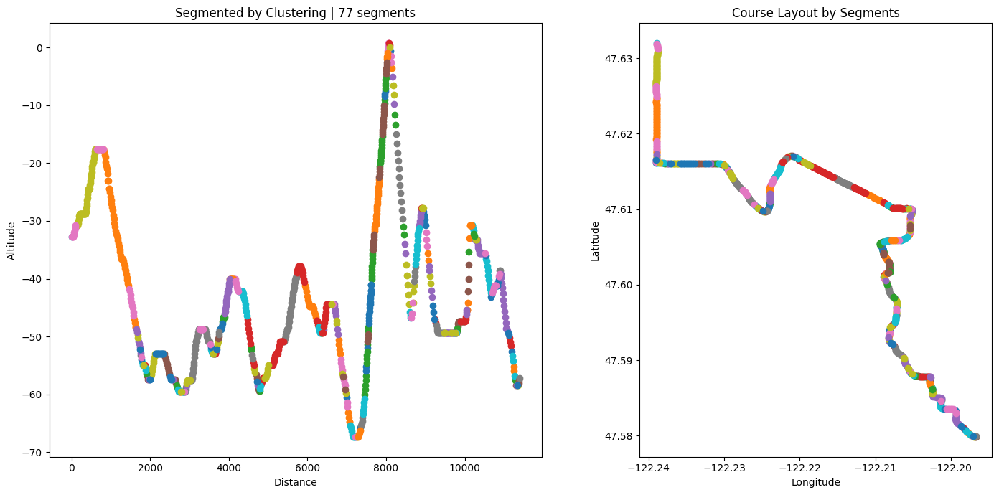

File: bellvue_blaseter.csv, SW: 51, PO: 3, DT: 10.0, LK: complete, Segments: 33


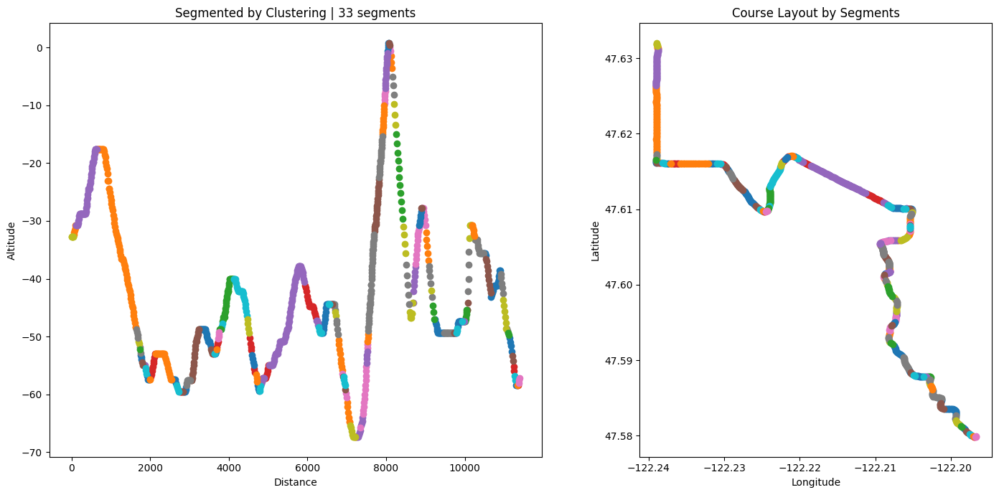

File: bellvue_blaseter.csv, SW: 51, PO: 3, DT: 15.0, LK: complete, Segments: 20


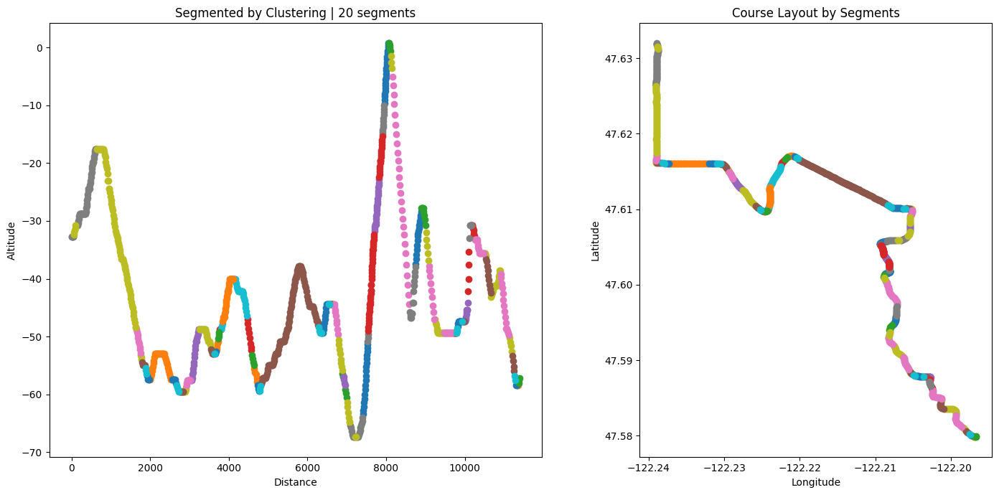

File: bellvue_blaseter.csv, SW: 51, PO: 3, DT: 20.0, LK: complete, Segments: 13


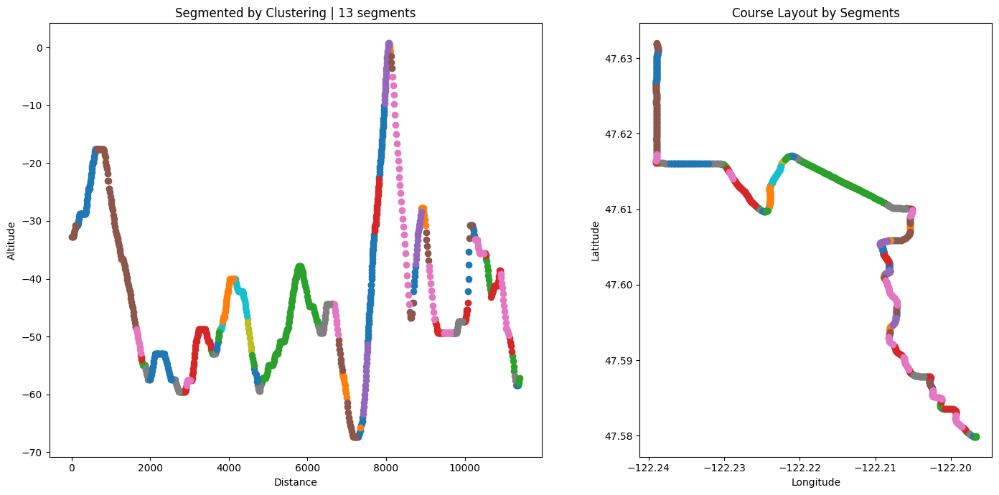

File: bellvue_blaseter.csv, SW: 51, PO: 4, DT: 5.0, LK: complete, Segments: 79


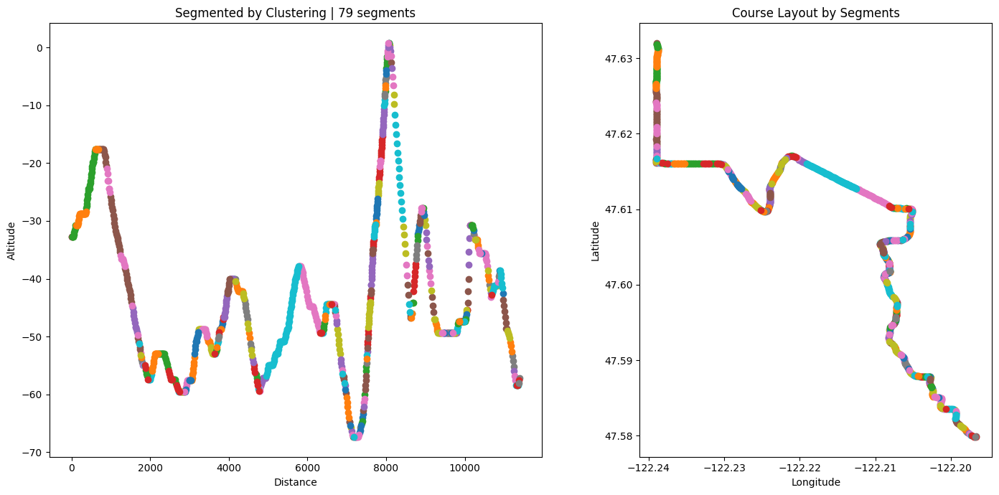

File: bellvue_blaseter.csv, SW: 51, PO: 4, DT: 10.0, LK: complete, Segments: 34


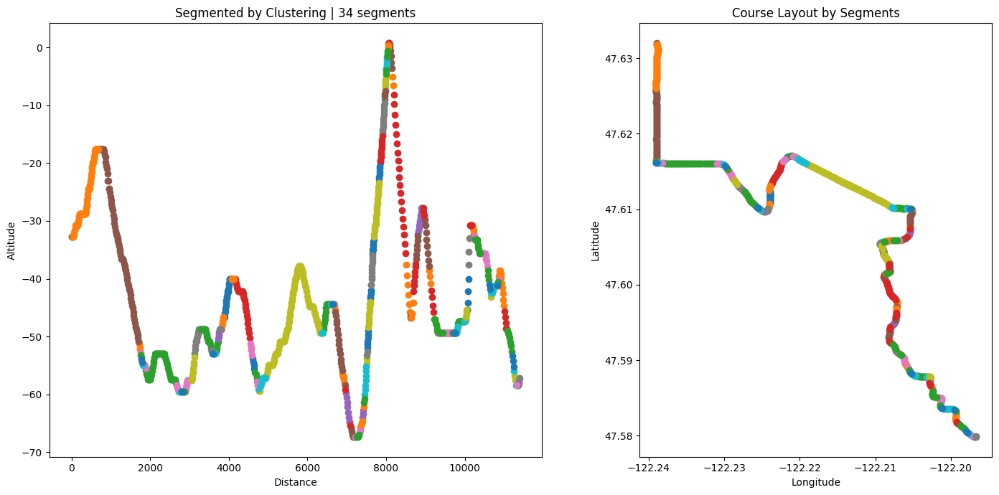

File: bellvue_blaseter.csv, SW: 51, PO: 4, DT: 15.0, LK: complete, Segments: 20


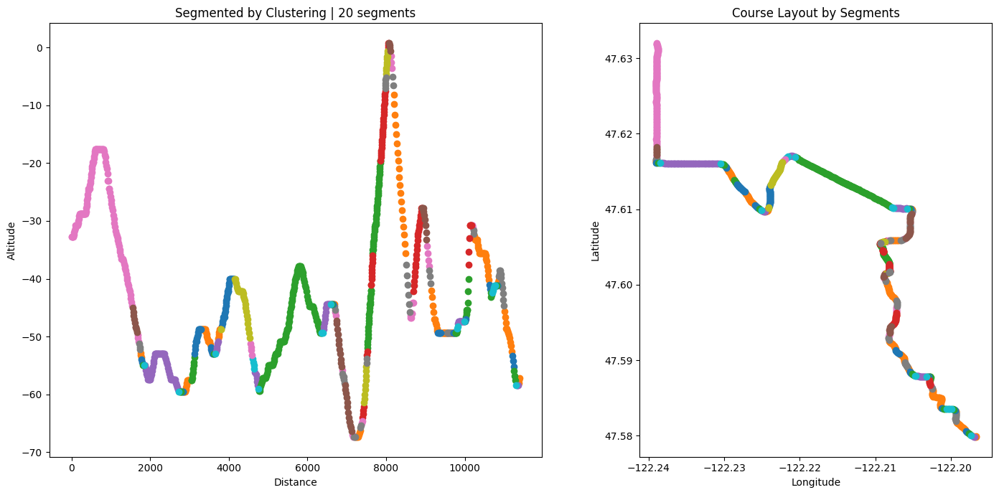

File: bellvue_blaseter.csv, SW: 51, PO: 4, DT: 20.0, LK: complete, Segments: 14


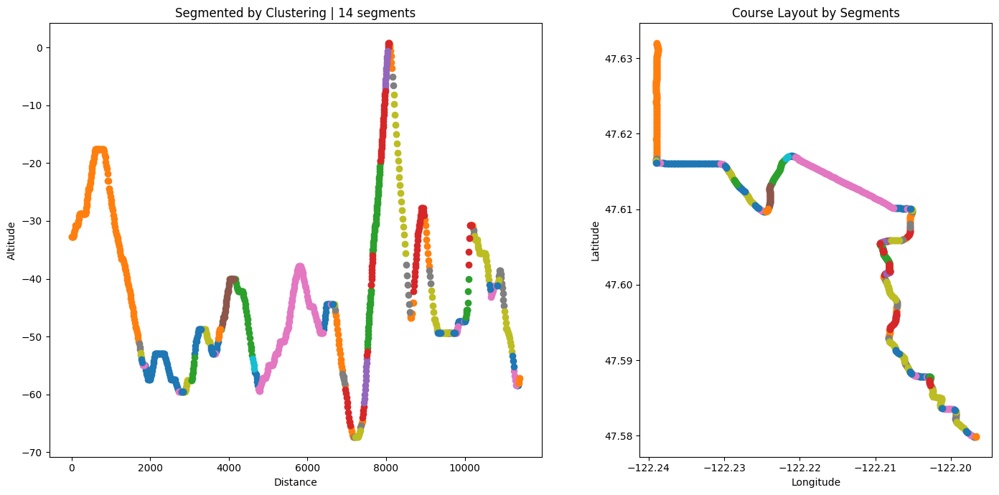

File: bellvue_blaseter.csv, SW: 101, PO: 2, DT: 5.0, LK: complete, Segments: 55


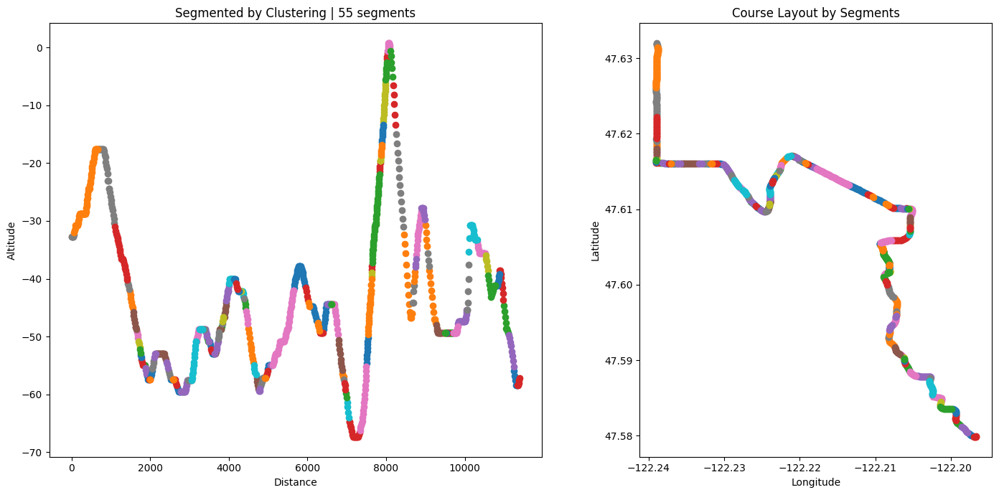

File: bellvue_blaseter.csv, SW: 101, PO: 2, DT: 10.0, LK: complete, Segments: 27


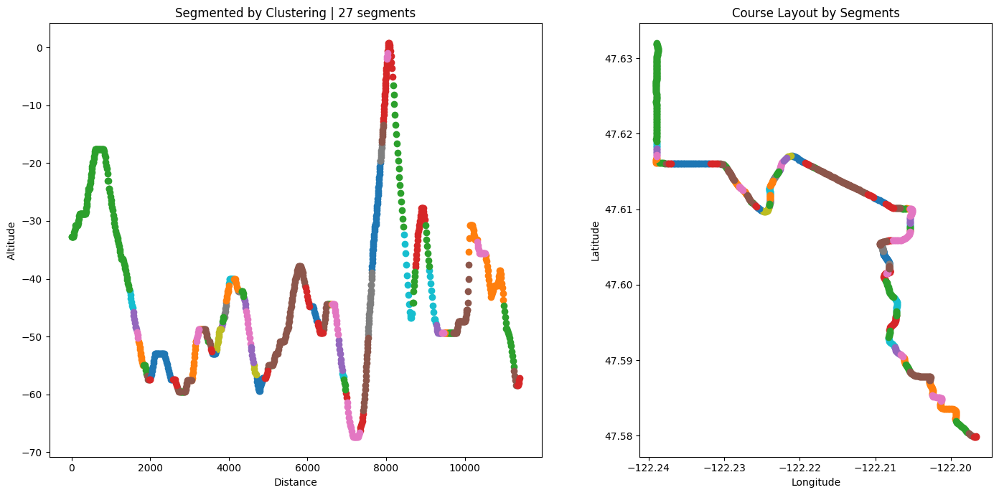

File: bellvue_blaseter.csv, SW: 101, PO: 2, DT: 15.0, LK: complete, Segments: 17


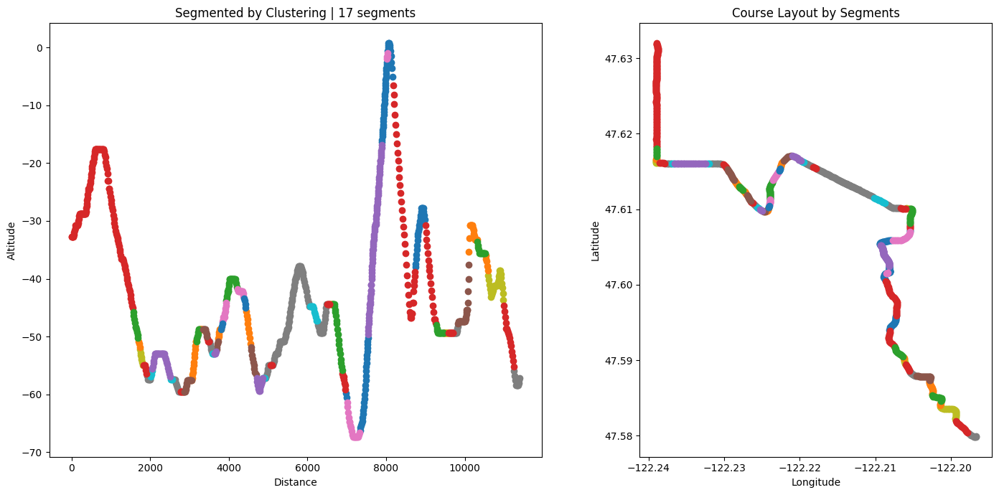

File: bellvue_blaseter.csv, SW: 101, PO: 2, DT: 20.0, LK: complete, Segments: 12


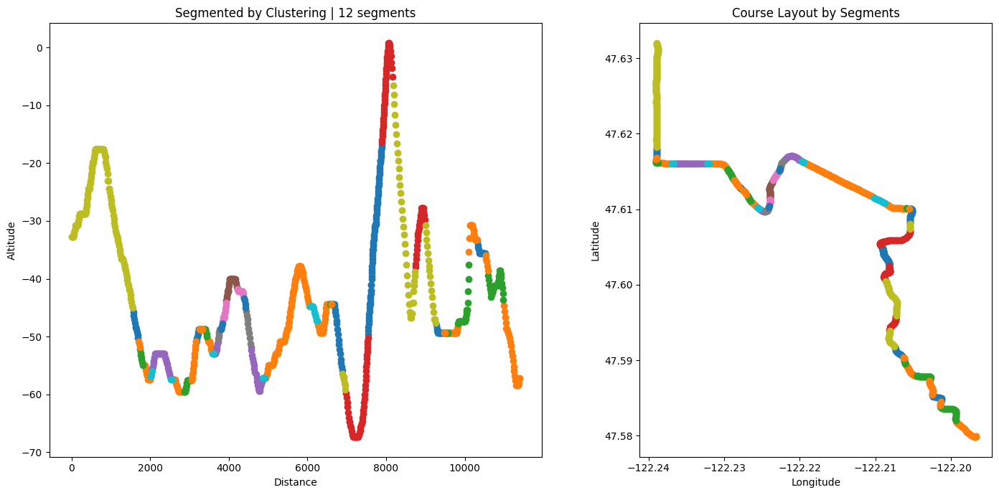

File: bellvue_blaseter.csv, SW: 101, PO: 3, DT: 5.0, LK: complete, Segments: 56


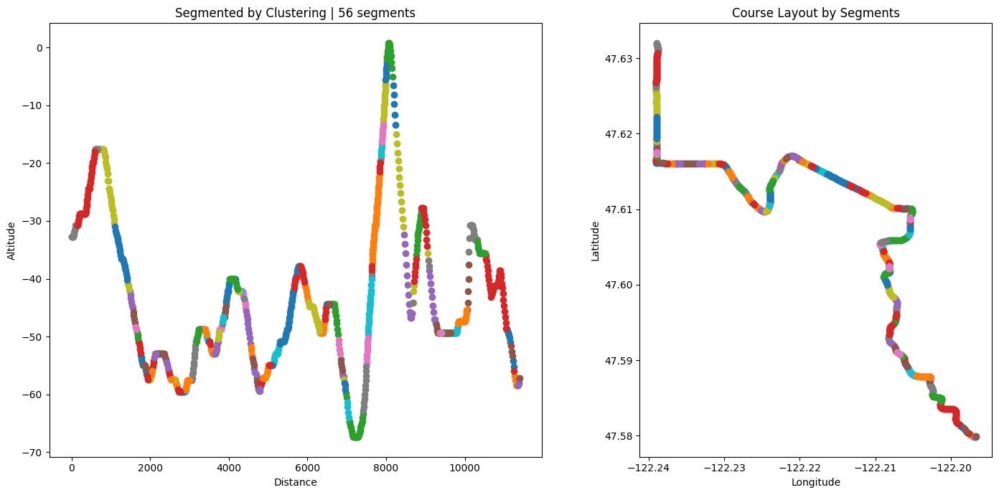

File: bellvue_blaseter.csv, SW: 101, PO: 3, DT: 10.0, LK: complete, Segments: 27


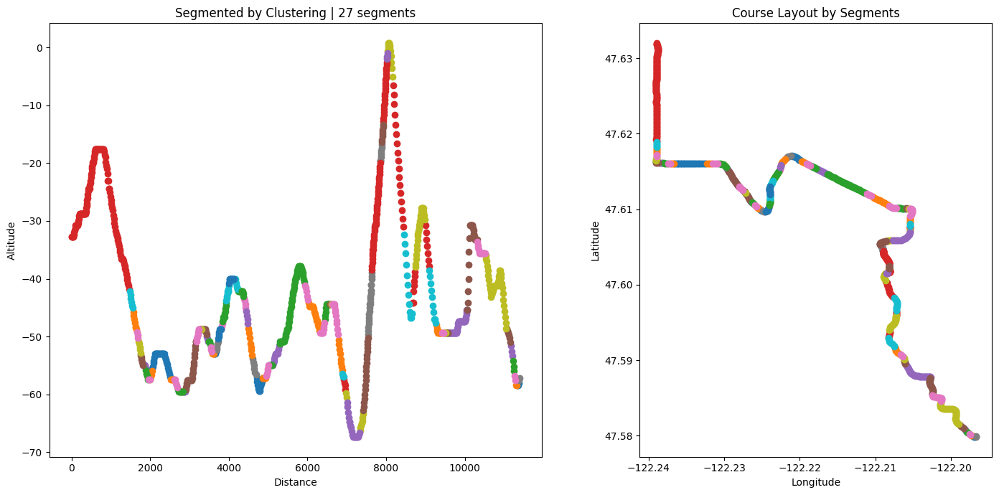

File: bellvue_blaseter.csv, SW: 101, PO: 3, DT: 15.0, LK: complete, Segments: 15


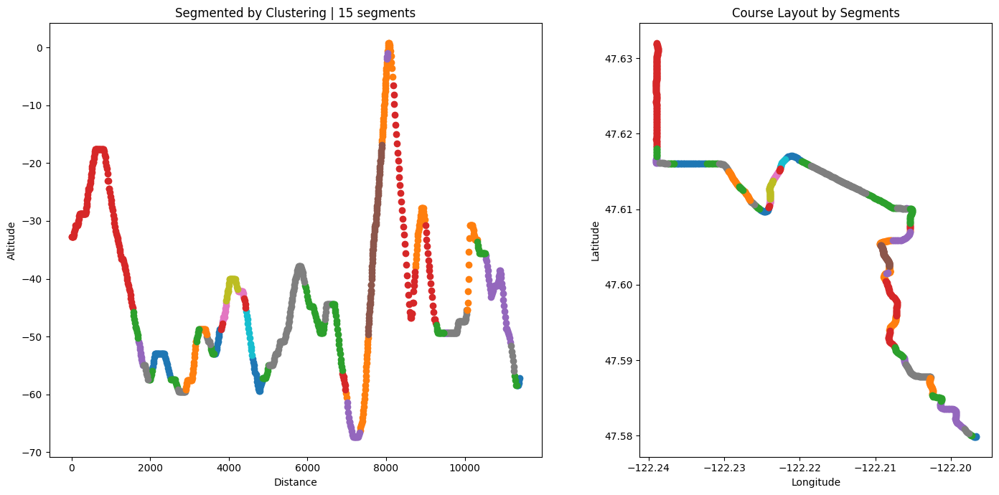

File: bellvue_blaseter.csv, SW: 101, PO: 3, DT: 20.0, LK: complete, Segments: 11


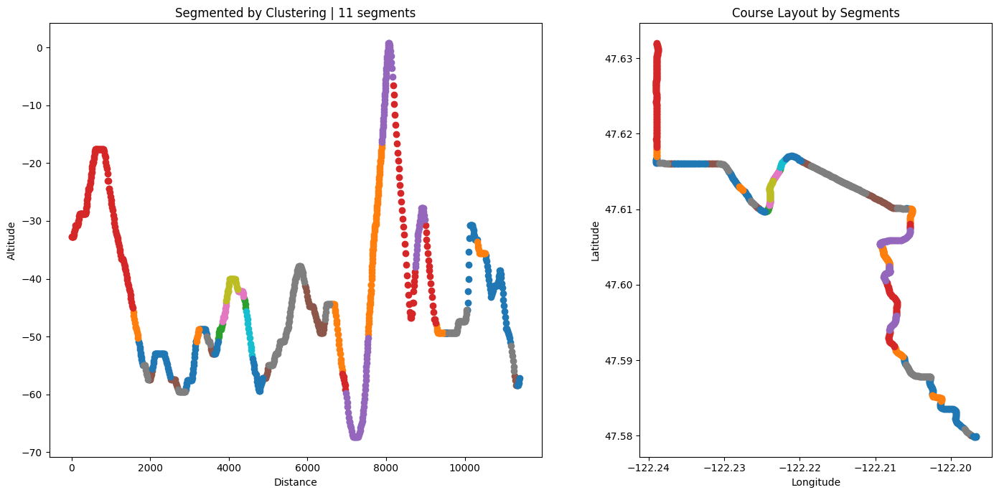

File: bellvue_blaseter.csv, SW: 101, PO: 4, DT: 5.0, LK: complete, Segments: 71


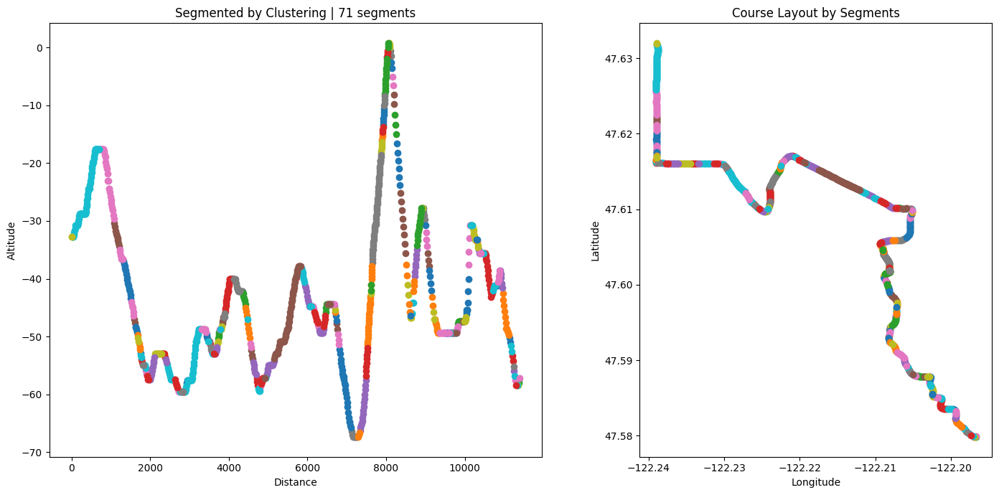

File: bellvue_blaseter.csv, SW: 101, PO: 4, DT: 10.0, LK: complete, Segments: 30


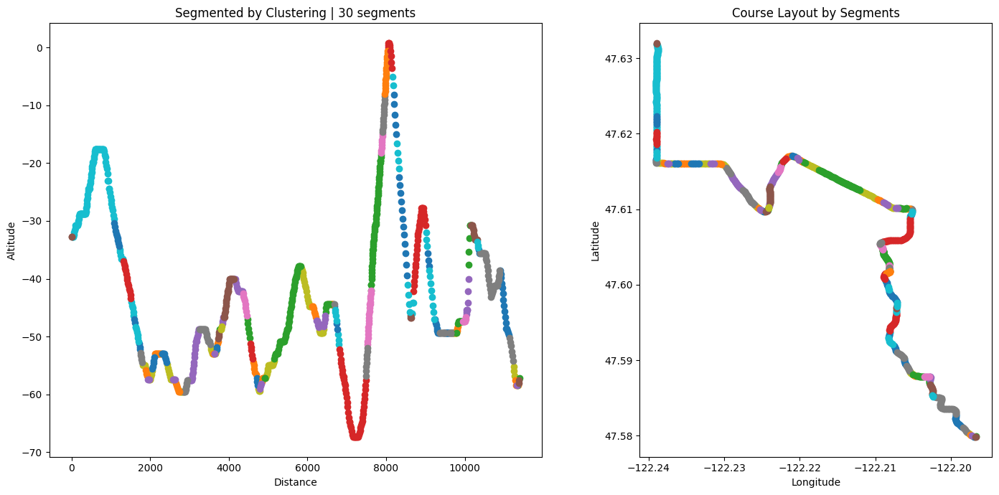

File: bellvue_blaseter.csv, SW: 101, PO: 4, DT: 15.0, LK: complete, Segments: 18


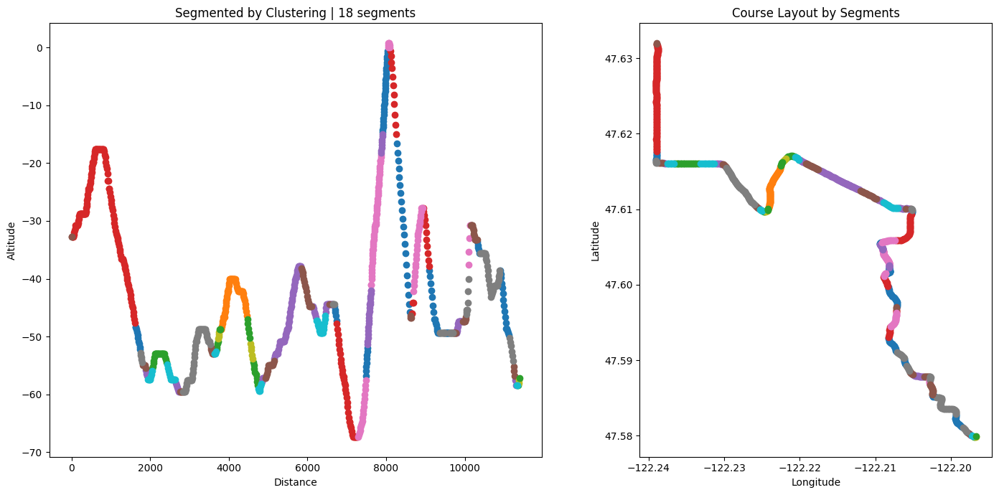

File: bellvue_blaseter.csv, SW: 101, PO: 4, DT: 20.0, LK: complete, Segments: 11


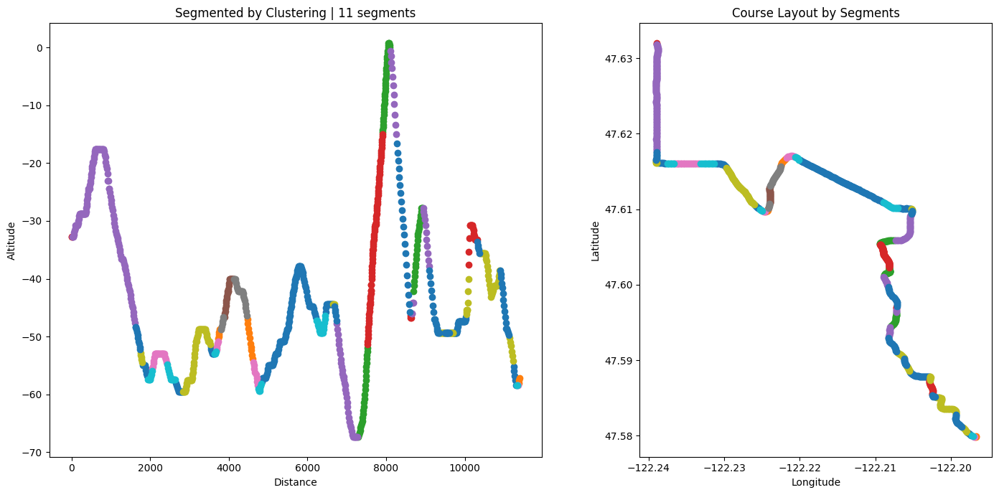

File: bellvue_blaseter.csv, SW: 301, PO: 2, DT: 5.0, LK: complete, Segments: 22


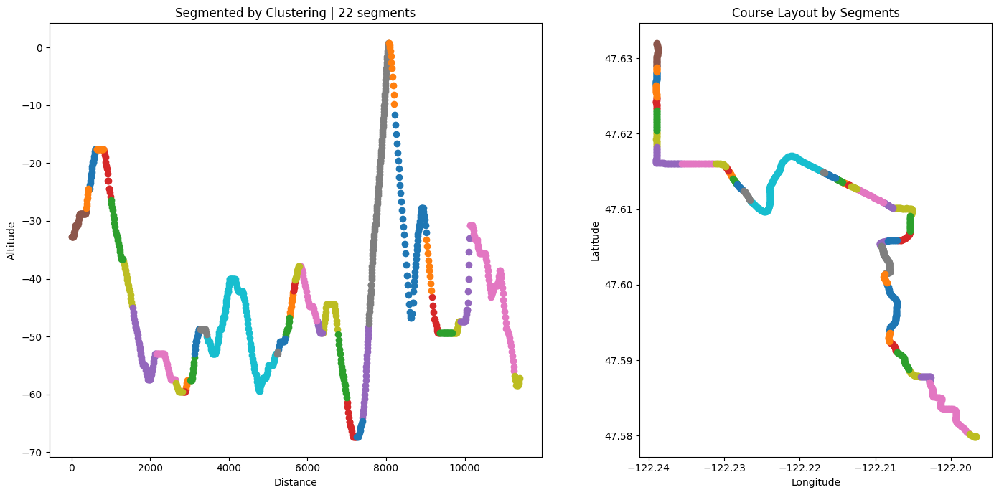

File: bellvue_blaseter.csv, SW: 301, PO: 2, DT: 10.0, LK: complete, Segments: 11


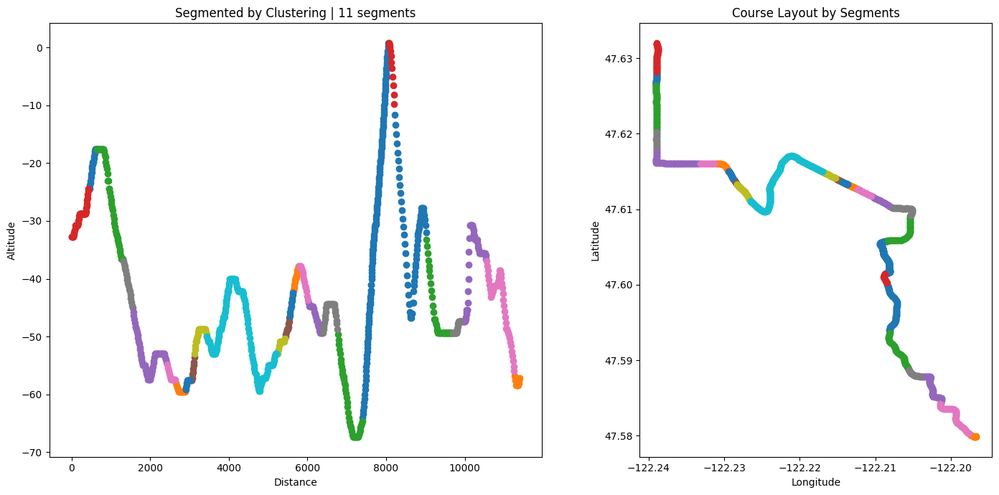

File: bellvue_blaseter.csv, SW: 301, PO: 2, DT: 15.0, LK: complete, Segments: 7


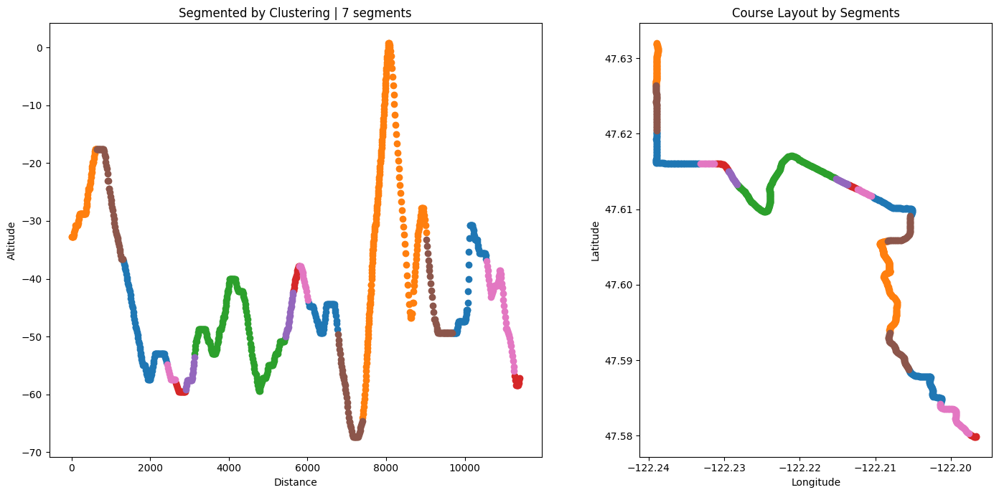

File: bellvue_blaseter.csv, SW: 301, PO: 2, DT: 20.0, LK: complete, Segments: 6


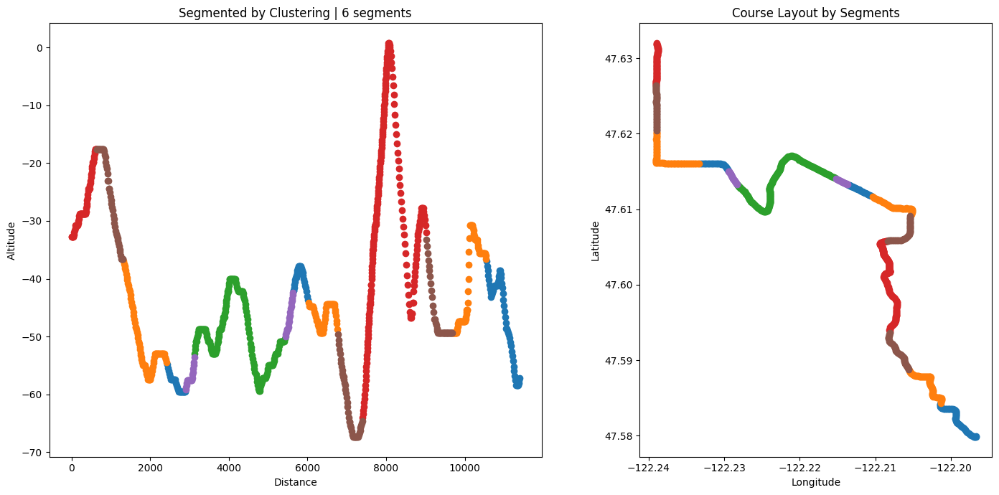

File: bellvue_blaseter.csv, SW: 301, PO: 3, DT: 5.0, LK: complete, Segments: 25


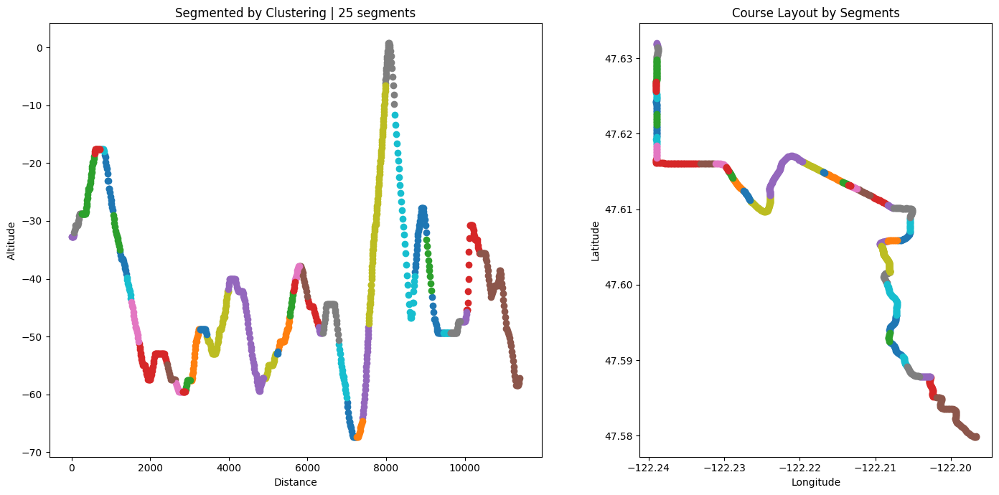

File: bellvue_blaseter.csv, SW: 301, PO: 3, DT: 10.0, LK: complete, Segments: 12


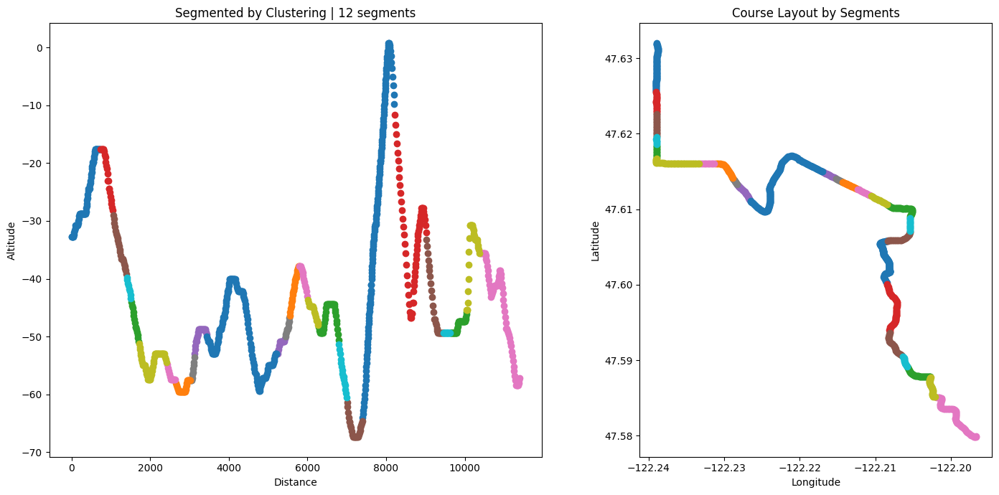

File: bellvue_blaseter.csv, SW: 301, PO: 3, DT: 15.0, LK: complete, Segments: 7


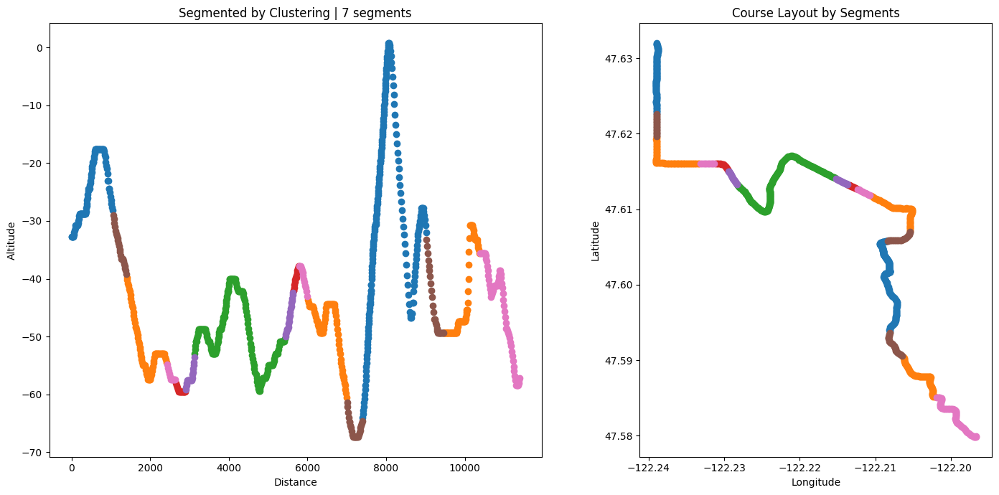

File: bellvue_blaseter.csv, SW: 301, PO: 3, DT: 20.0, LK: complete, Segments: 6


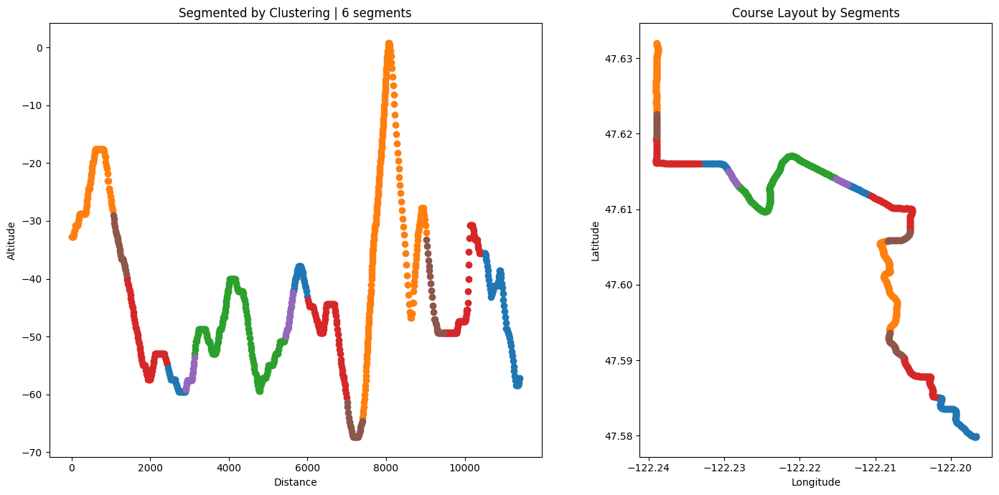

File: bellvue_blaseter.csv, SW: 301, PO: 4, DT: 5.0, LK: complete, Segments: 43


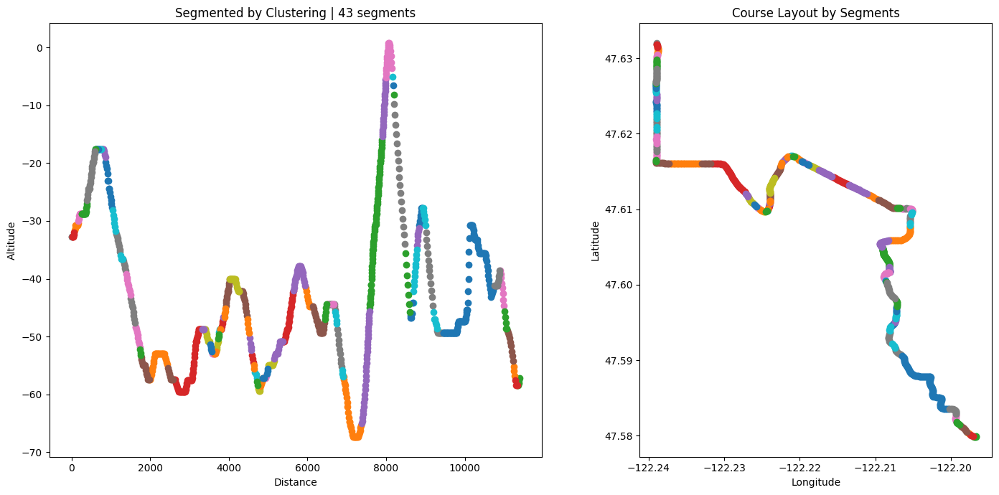

File: bellvue_blaseter.csv, SW: 301, PO: 4, DT: 10.0, LK: complete, Segments: 20


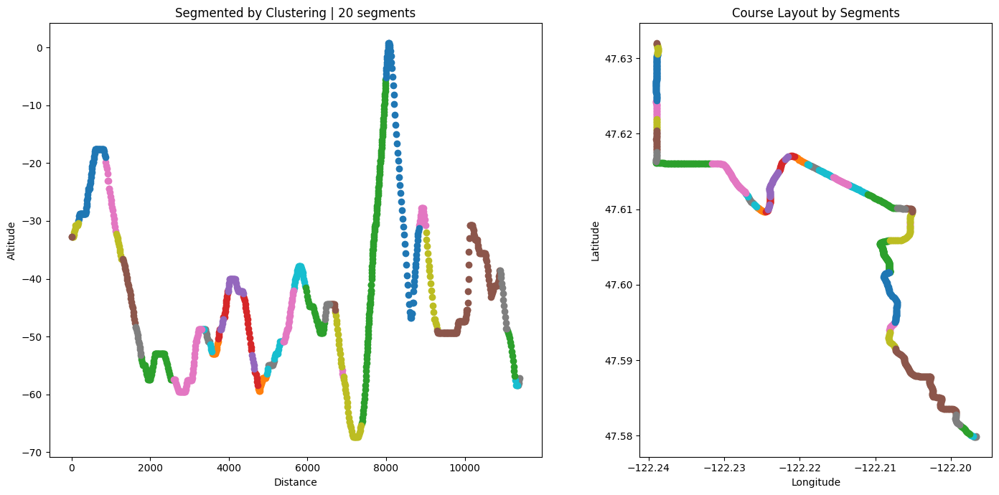

File: bellvue_blaseter.csv, SW: 301, PO: 4, DT: 15.0, LK: complete, Segments: 13


KeyboardInterrupt: 

In [50]:


# Create a list or DataFrame to store the results
results = []
#referencing the above code, loop through all the csv files in the current directory for each set of of parameters so i can visualize the tuning of the parameters
import os
import glob

# Get all CSV files in the current directory
for file in glob.glob("*.csv"):
    data = pd.read_csv(file)
    # Safely handle small data frames
    if len(data) < 2:
        print(f"Skipping {file} because it has insufficient rows.")
        continue
    
    # Calculate heading from lat/lon
    heading = np.arctan2(
        np.diff(data['lat']), 
        np.diff(data['lon'])
    ) * 180 / np.pi
    
    # Append the last heading so array lengths match
    heading = np.append(heading, heading[-1])
    data['heading'] = heading

    # If 'distance' isn't already cumulative, do so. 
    # Otherwise, if your CSV already has cumulative distance, remove the next line.
    data['distance'] = data['distance'].cumsum()

    for smoothing_window in [51, 101, 301]:
        for poly_order in [ 2, 3, 4]:
            for distance_threshold in [5.0, 10.0, 15.0, 20.0]:
                for linkage in ['complete']:
                    
                    # Create an instance of the segmenter
                    segmenter = CourseSegmentation(
                        data=data,
                        smoothing_window=smoothing_window,
                        poly_order=poly_order,
                        distance_threshold=distance_threshold,
                        linkage=linkage
                    )

                    # Cluster and get labels
                    labels = segmenter.cluster_course_segments()
                    
                    # How many unique segments?
                    num_segments = len(np.unique(labels))

                    # Print out current parameters and number of segments
                    print(
                        f"File: {file}, "
                        f"SW: {smoothing_window}, "
                        f"PO: {poly_order}, "
                        f"DT: {distance_threshold}, "
                        f"LK: {linkage}, "
                        f"Segments: {num_segments}"
                    )

                    # Plot each result
                    segmenter.plot_segments()

                    # Save figure
                    #plt.savefig(
                    #    f"ref_plots/{file}_sw{smoothing_window}"
                    #    f"_po{poly_order}_dt{distance_threshold}_lk{linkage}.png"
                    #)
                    plt.close()

                    # Append row to results list
                    results.append({
                        "file": file,
                        "smoothing_window": smoothing_window,
                        "poly_order": poly_order,
                        "distance_threshold": distance_threshold,
                        "linkage": linkage,
                        "num_segments": num_segments
                    })

# Convert results list to DataFrame
results_df = pd.DataFrame(results)

# Optionally, save results to a CSV for further analysis
results_df.to_csv("clustering_results.csv", index=False)

print("All files processed. Results saved to clustering_results.csv.")

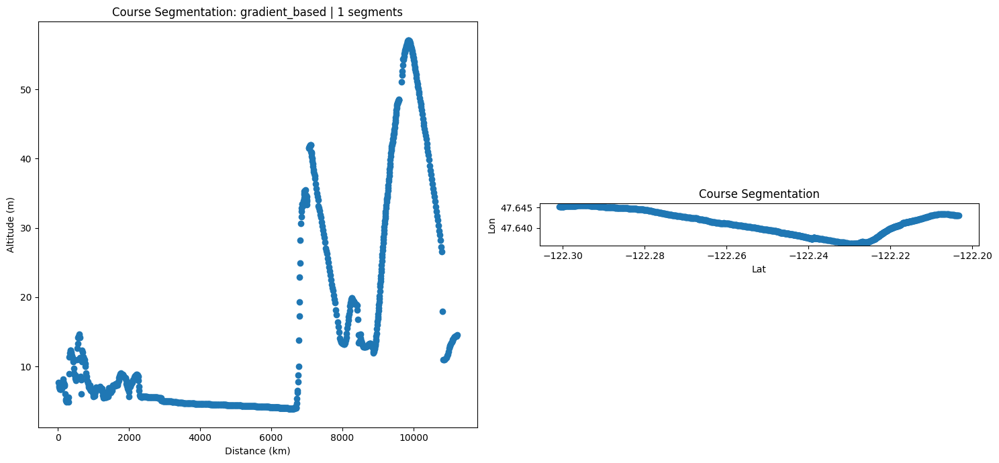

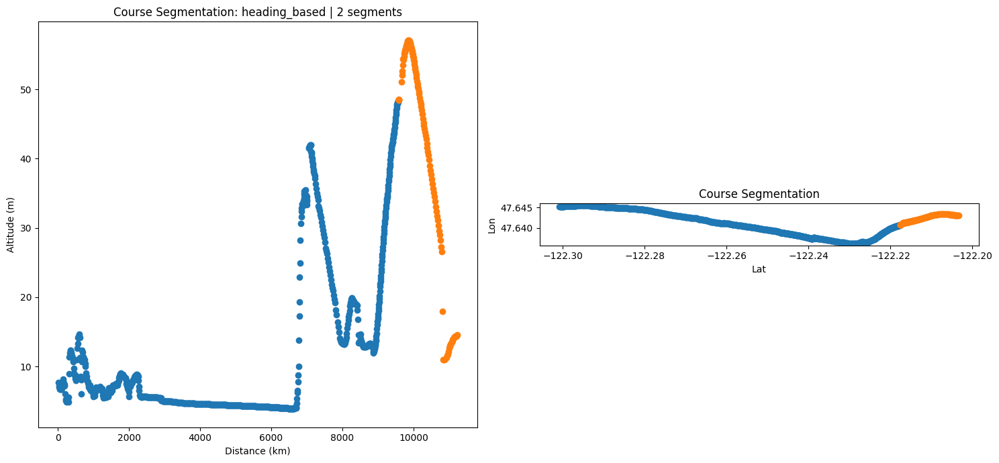

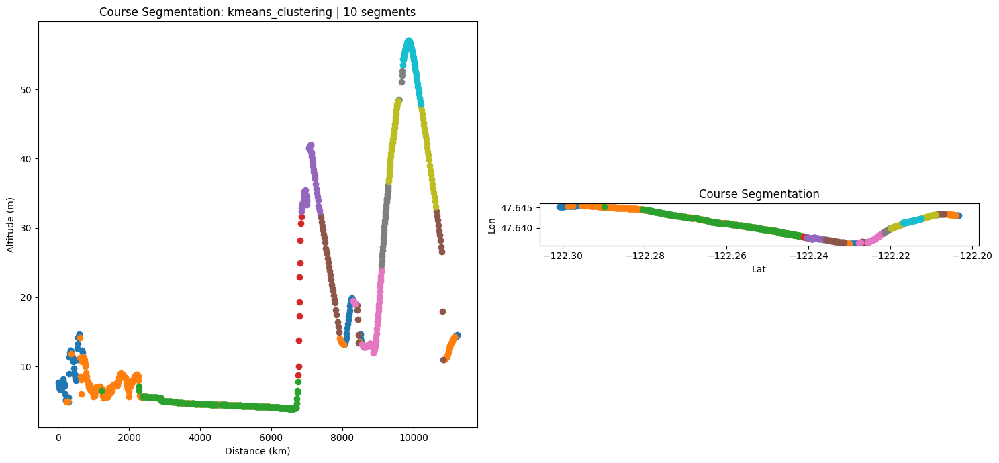

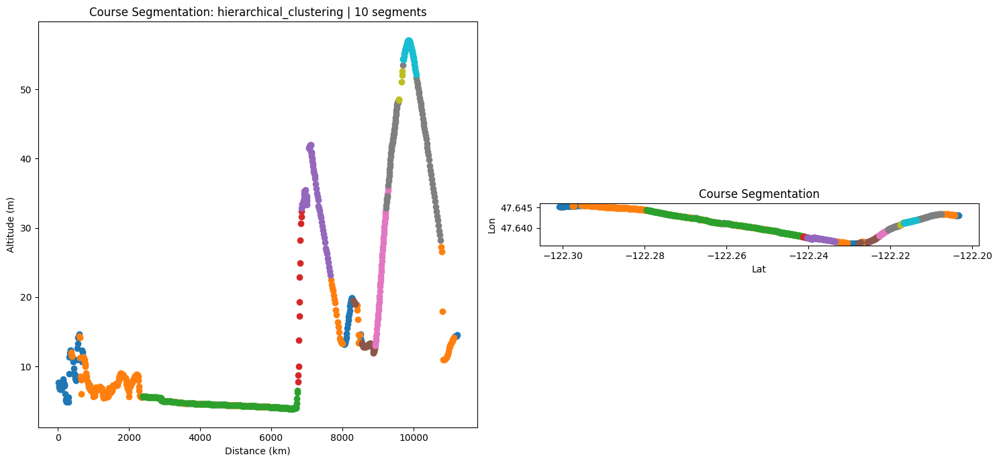

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from sklearn.cluster import KMeans, AgglomerativeClustering
from visualizations import *

class CourseSegmentation:
    def __init__(self, data, smoothing_window=11, poly_order=2):
        """
        Initialize the class with course data and smoothing parameters.
        :param data: DataFrame containing 'distance', 'gradient', 'heading', and 'altitude'.
        :param smoothing_window: Window size for Savitzky-Golay filter.
        :param poly_order: Polynomial order for Savitzky-Golay filter.
        """
        self.data = data.copy()
        self.smoothing_window = smoothing_window
        self.poly_order = poly_order
        self.smoothed_data = self.smooth_data()
        self.segments = {}

    def smooth_data(self):
        """
        Apply Savitzky-Golay filter to smooth noisy data.
        :return: Smoothed DataFrame.
        """
        smoothed = self.data.copy()
        for col in ['gradient', 'heading', 'altitude']:
            smoothed[col] = savgol_filter(self.data[col], self.smoothing_window, self.poly_order)
        return smoothed

    def gradient_based_segmentation(self, threshold=1.0):
        """
        Segment the course based on gradient changes.
        :param threshold: Gradient change threshold for segmentation.
        """
        self.segments['gradient_based'] = self._segment_by_threshold('gradient', threshold)

    def heading_based_segmentation(self, threshold=15.0):
        """
        Segment the course based on heading changes.
        :param threshold: Heading change threshold for segmentation (in degrees).
        """
        self.segments['heading_based'] = self._segment_by_threshold('heading', threshold)

    def wind_based_segmentation(self, wind_direction, threshold=30.0):
        """
        Segment the course based on wind-relative changes.
        :param wind_direction: Wind direction in degrees.
        :param threshold: Relative heading change threshold for segmentation.
        """
        relative_heading = np.abs(self.smoothed_data['heading'] - wind_direction) % 360
        self.segments['wind_based'] = self._segment_by_threshold(relative_heading, threshold)

    def clustering_segmentation(self, method='kmeans', n_clusters=10):
        """
        Segment the course using clustering.
        :param method: 'kmeans' or 'hierarchical' clustering.
        :param n_clusters: Number of clusters.
        """
        features = self.smoothed_data[['gradient', 'heading', 'altitude']].values
        if method == 'kmeans':
            model = KMeans(n_clusters=n_clusters, random_state=42)
        elif method == 'hierarchical':
            model = AgglomerativeClustering(n_clusters=n_clusters)
        else:
            raise ValueError("Invalid method. Use 'kmeans' or 'hierarchical'.")
        self.segments[f'{method}_clustering'] = model.fit_predict(features)

    def _segment_by_threshold(self, column, threshold):
        """
        Helper function to segment by a given column and threshold.
        """
        changes = np.abs(np.diff(self.smoothed_data[column]))
        segments = np.zeros(len(self.data))
        current_segment = 0
        for i, change in enumerate(changes):
            if change > threshold:
                current_segment += 1
            segments[i + 1] = current_segment
        return segments

    def plot_segments(self, method):
        """
        Plot the segmented course for a given method.
        :param method: Segmentation method to plot.
        """
        if method not in self.segments:
            print(f"No segments found for method '{method}'. Please run it first.")
            return

        self.data['segment'] = self.segments[method]
        fig, axes = plt.subplots(1, 2, figsize=(15, 7))
        for segment in self.data['segment'].unique():
            segment_data = self.data[self.data['segment'] == segment]
            axes[0].scatter(segment_data['distance'], segment_data['altitude'], label=f"Segment {int(segment)}")
            axes[1].scatter(segment_data['lon'], segment_data['lat'], label=f"Segment {int(segment)}")
        axes[0].set_xlabel("Distance (km)")
        axes[0].set_ylabel("Altitude (m)")
        axes[0].set_title(f"Course Segmentation: {method} | {len(self.data['segment'].unique())} segments")
        #axes[0].legend()

        axes[1].set_xlabel('Lat')
        axes[1].set_ylabel('Lon')
        axes[1].set_aspect('equal')
        axes[1].set_title('Course Segmentation')

        plt.tight_layout()
        plt.show()
        

data = pd.read_csv('data_sample.csv')
#calculate heading from the data based on lat and lon fields
heading = np.arctan2(np.diff(data['lat']), np.diff(data['lon'])) * 180 / np.pi
heading = np.append(heading, heading[-1])
data['heading'] = heading
data['distance']=data['distance'].cumsum()

course_segmenter = CourseSegmentation(data[1:])

#course_segmenter = CourseSegmentation(data, smoothing_window=20, poly_order=2)
course_segmenter.gradient_based_segmentation(100)
course_segmenter.heading_based_segmentation()
#course_segmenter.wind_based_segmentation(wind_direction=180)
course_segmenter.clustering_segmentation(method='kmeans', n_clusters=10)
course_segmenter.clustering_segmentation(method='hierarchical', n_clusters=10)
course_segmenter.plot_segments('gradient_based')
course_segmenter.plot_segments('heading_based')
#course_segmenter.plot_segments('wind_based')
course_segmenter.plot_segments('kmeans_clustering')
course_segmenter.plot_segments('hierarchical_clustering')

# Example usage:
# Assuming you have a DataFrame `course_data` with columns ['distance', 'gradient', 'heading', 'altitude']
# course_segmenter = CourseSegmentation(course_data)
# course_segmenter.gradient_based_segmentation()
# course_segmenter.heading_based_segmentation()
# course_segmenter.wind_based_segmentation(wind_direction=180)
# course_segmenter.clustering_segmentation(method='kmeans', n_clusters=10)
# course_segmenter.plot_segments('gradient_based')


In [12]:
data['segment'] = np.insert(course_segmenter.segments['kmeans_clustering'],0,0)
create_map(data[1:], color='segment')

c:\Users\chrisuberti\Documents\GitHub\pace-yourself\visualizations.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["color"] = categorical_colormap(df, 'segment')
c:\Users\chrisuberti\Documents\GitHub\pace-yourself\visualizations.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["color"] = df["color"].apply(lambda x: [int(255 * c) for c in x])


{
  "initialViewState": {
    "latitude": 47.641144508646995,
    "longitude": -122.25085262563582,
    "pitch": 0,
    "zoom": 12
  },
  "layers": [
    {
      "@@type": "ScatterplotLayer",
      "data": [
        {
          "altitude": 7.7,
          "color": [
            31,
            119,
            180,
            255
          ],
          "cumulative_distance": 0.0111144556814823,
          "delta_altitude": -0.3999999999999994,
          "delta_lat": 1.00000000458067e-06,
          "delta_lon": 0.0001000000000033,
          "distance": 11.114455681482337,
          "gradient": -3.598916685289724,
          "heading": 20.687658570731063,
          "lat": 47.645195,
          "lon": -122.300815,
          "segment": 5
        },
        {
          "altitude": 7.2,
          "color": [
            31,
            119,
            180,
            255
          ],
          "cumulative_distance": 0.0281027343930824,
          "delta_altitude": -0.5,
          "delta_lat": 5.399999999866623e-05,
          "delta_lon": 0.0001429999999942,
          "distance": 28.102734393082468,
          "gradient": -2.943205774335361,
          "heading": 0.0,
          "lat": 47.645249,
          "lon": -122.300672,
          "segment": 5
        },
        {
          "altitude": 7.0,
          "color": [
            31,
            119,
            180,
            255
          ],
          "cumulative_distance": 0.0379941053933792,
          "delta_altitude": -0.2000000000000001,
          "delta_lat": 0.0,
          "delta_lon": 8.900000000267028e-05,
          "distance": 37.99410539337924,
          "gradient": -2.0219643969880368,
          "heading": 3.0774554001753316,
          "lat": 47.645249,
          "lon": -122.300583,
          "segment": 5
        },
        {
          "altitude": 6.8,
          "color": [
            31,
            119,
            180,
            255
          ],
          "cumulative_distance": 0.0483449596527209,
          "delta_altitude": -0.2000000000000001,
          "delta_lat": 5.000000001587068e-06,
          "delta_lon": 9.30000000067821e-05,
          "distance": 48.34495965272092,
          "gradient": -1.9322076708741185,
          "heading": 2.361374656491023,
          "lat": 47.645254,
          "lon": -122.30049,
          "segment": 5
        },
        {
          "altitude": 6.7,
          "color": [
            31,
            119,
            180,
            255
          ],
          "cumulative_distance": 0.0591346048620028,
          "delta_altitude": -0.0999999999999996,
          "delta_lat": 3.999999997006398e-06,
          "delta_lon": 9.699999999668309e-05,
          "distance": 59.13460486200287,
          "gradient": -0.926814534308998,
          "heading": 5.142764556915026,
          "lat": 47.645258,
          "lon": -122.300393,
          "segment": 5
        },
        {
          "altitude": 6.7,
          "color": [
            31,
            119,
            180,
            255
          ],
          "cumulative_distance": 0.0702934253767745,
          "delta_altitude": 0.0,
          "delta_lat": 8.999999998593466e-06,
          "delta_lon": 0.0001000000000033,
          "distance": 70.29342537677454,
          "gradient": 0.0,
          "heading": 7.523820438567405,
          "lat": 47.645267,
          "lon": -122.300293,
          "segment": 5
        },
        {
          "altitude": 6.7,
          "color": [
            31,
            119,
            180,
            255
          ],
          "cumulative_distance": 0.0821764662981873,
          "delta_altitude": 0.0,
          "delta_lat": 1.4000000000180536e-05,
          "delta_lon": 0.0001060000000023,
          "distance": 82.17646629818736,
          "gradient": 0.0,
          "heading": -0.6365935743553452,
          "lat": 47.645281,
          "lon": -122.300187,
          "segment": 5
        },
        {
          "altitude": 6.7,
          "color": [
            31,
           

In [ ]:
pip install geopandas

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


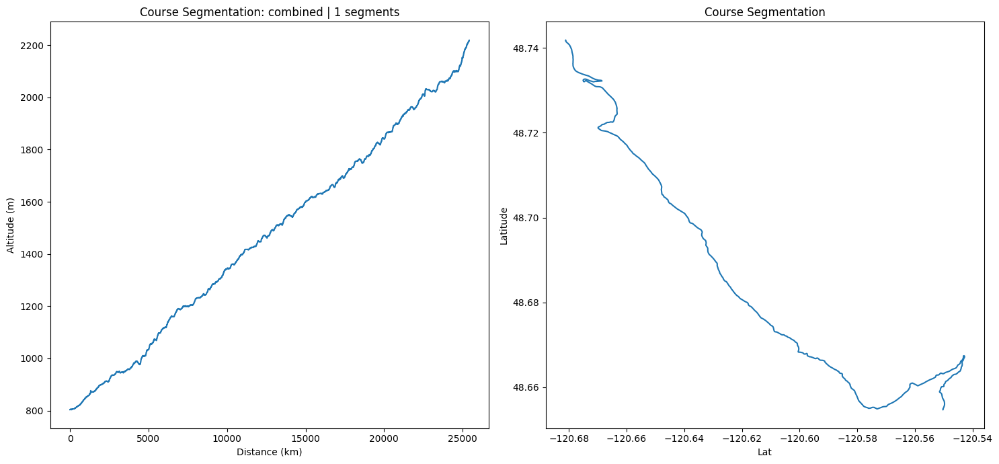

In [73]:
class CourseSegmentationEnhanced(CourseSegmentation):
    def __init__(self, data, smoothing_window=11, poly_order=2):
        """
        Initialize the class with enhanced capabilities for combined segmentation and better preprocessing.
        Inherits from the base CourseSegmentation class.
        """
        super().__init__(data, smoothing_window, poly_order)
    
    def preprocess(self, gradient_smooth=True, heading_smooth=True, altitude_smooth=True):
        """
        Preprocess data by smoothing all relevant fields to reduce noise.
        :param gradient_smooth: Smooth the gradient data.
        :param heading_smooth: Smooth the heading data.
        :param altitude_smooth: Smooth the altitude data.
        """
        for col, apply_smooth in zip(['gradient', 'heading', 'altitude'], 
                                     [gradient_smooth, heading_smooth, altitude_smooth]):
            if apply_smooth:
                self.smoothed_data[col] = savgol_filter(self.data[col], self.smoothing_window, self.poly_order)

    def combined_segmentation(self, gradient_threshold=1.0, heading_threshold=15.0, bias=0.5):
        """
        Combine gradient and heading segmentation into a single method with tunable bias.
        :param gradient_threshold: Threshold for gradient change.
        :param heading_threshold: Threshold for heading change.
        :param bias: Weight between gradient and heading influence (0.0 = all heading, 1.0 = all gradient).
        """
        gradient_changes = np.abs(np.diff(self.smoothed_data['gradient']))
        heading_changes = np.abs(np.diff(self.smoothed_data['heading']))
        
        # Normalize both change metrics for equal weighting
        gradient_changes /= np.max(gradient_changes) if np.max(gradient_changes) > 0 else 1
        heading_changes /= np.max(heading_changes) if np.max(heading_changes) > 0 else 1

        # Combine changes using bias
        combined_changes = (bias * gradient_changes) + ((1 - bias) * heading_changes)

        # Determine segments based on thresholds
        combined_segments = np.zeros(len(self.data))
        current_segment = 0
        for i, change in enumerate(combined_changes):
            if change > max(gradient_threshold, heading_threshold):  # Use the more restrictive threshold
                current_segment += 1
            combined_segments[i + 1] = current_segment
        
        self.segments['combined'] = combined_segments

course_segmenter = CourseSegmentationEnhanced(data[1:])
course_segmenter.combined_segmentation(gradient_threshold=1, heading_threshold=1, bias=0.5)
course_segmenter.plot_segments('combined')